# Wonderful Wines of the World

## Initial Setup

In [1]:
## import libraries

import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sns

import os
from math import ceil



In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm


import umap
import umap.plot


In [3]:
from sklearn.base import clone

from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA, FactorAnalysis

from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, PowerTransformer, RobustScaler
from sklearn.preprocessing import OrdinalEncoder

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth


from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE

from sklearn.metrics import silhouette_score, silhouette_samples

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split

from scipy.cluster.hierarchy import linkage, fcluster, dendrogram

import graphviz


In [4]:
import warnings
warnings.filterwarnings('ignore')

# https://stackoverflow.com/questions/56618739/matplotlib-throws-warning-message-because-of-findfont-python
import logging
logging.getLogger('matplotlib.font_manager').disabled = True

# importing sompy enables more logging
logging.disable(logging.INFO)

In [5]:
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView


In [6]:
#!pip install kneed

In [7]:
from kneed import KneeLocator

In [8]:
## Note versions used

print('Pandas version ',pd.__version__)
print('Numpy version ',np.__version__)
print('Scipy version ',sp.__version__)
print('Seaborn version ',sns.__version__)


Pandas version  1.3.3
Numpy version  1.20.3
Scipy version  1.7.0
Seaborn version  0.11.2


## Define some constant variables

In [9]:
COLORS = ['#7a2b5d', '#975c86', '#b38dad', '#d0bed6', '#edf0ff', '#eae1cd', '#e8d19a', '#e6c064', '#e3ae29']
CAT_COLORS = ['#7a2b5d', '#EBBD53', '#4475B0', '#21BFAB', '#EF5072']
CONTRAST_COLORS = [COLORS[i] for i in range(len(COLORS)) if (i%2) == 0]

DIV_COLORS = COLORS.copy()

DEFAULT_PALETTE = sns.color_palette(COLORS)
CONTRAST_PALETTE = sns.color_palette(CONTRAST_COLORS)
DIVERGENT_PALETTE = sns.color_palette(DIV_COLORS)
CAT_PALETTE = sns.color_palette(CAT_COLORS)


DIV_CMAP = LinearSegmentedColormap.from_list("div_colors", DIV_COLORS)
CAT_CMAP = LinearSegmentedColormap.from_list("cat_colors", CAT_COLORS)


SHOW_PLOTS = True
SAVE_PLOTS = True
RANDOM_STATE = 0

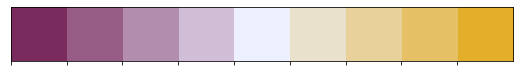

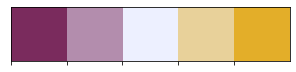

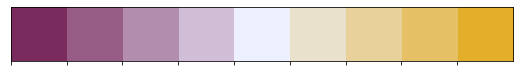

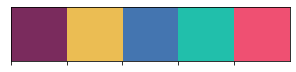

In [10]:
sns.palplot(DEFAULT_PALETTE)
sns.palplot(CONTRAST_PALETTE)
sns.palplot(DIVERGENT_PALETTE)
sns.palplot(CAT_PALETTE)
plt.show()

In [11]:
sns.set(style="white")

sns.set_context("paper")
sns.set_palette(DEFAULT_PALETTE)


plt.rcParams['figure.dpi'] = 70

In [12]:
show_plots = True
img_counter = 0
random_state = 0

IMG_PATH = '../../out/imgs/'

## Define some functions

In [13]:
def save_fig(title, fig):
    if SAVE_PLOTS == True:
        fn = IMG_PATH + title.replace(' ','-') + '.png'
        fig.savefig(fn, bbox_inches='tight')
        


In [14]:
## Function to plot histograms of numeric features for specified dataframe
def plot_histograms_boxplots(df, features, rows=4, title = "Histograms of Numeric Variables"):
    if SHOW_PLOTS:
        cols = ceil(len(features) / rows)
        fig = plt.figure(figsize=(4*cols,4*rows),
                         constrained_layout=True)
        
        subfigs = fig.subfigures(rows, cols)
    
        for subf, feat in zip(subfigs.flatten(), features):
            axs = subf.subplots(2, 1, sharex=True, \
                                gridspec_kw={'height_ratios': [4,1]})
        
            axs[0].hist(df[feat], color=COLORS[0])
            axs[0].set_ylabel(None)
            axs[0].set_title(feat, y=1, fontsize=6*rows)
        
            axs[1].set_xlabel(None)
            flierprops = dict(markerfacecolor='None', markersize=6,  markeredgecolor=COLORS[0])
            sns.boxplot(x=df[feat], ax=axs[1], color=COLORS[0], flierprops=flierprops)
            axs[1].set_xlabel(None)

            subf.suptitle(None)
        
        plt.suptitle(title, fontsize=8*rows)
        if SAVE_PLOTS:
            save_fig(title, fig)
        
        plt.show()
    else:
        print("show_plots is currently set to False")

In [15]:
def getIQR(df, colname) :
    q25 = df[colname].quantile(.25)
    q75 = df[colname].quantile(.75)
    iqr = (q75 - q25)

    upper_lim = q75 + 2 * iqr
    lower_lim = q25 - 2 * iqr

    above_ul = df.loc[df[colname]>upper_lim]
    below_ll = df.loc[df[colname]<lower_lim]
    
    if len(above_ul) > 0 :
        print(str(len(above_ul)) + " or " + str(round((100*len(above_ul)/len(df)),4)) + "% of rows are above the UL ["+ colname + "].")
    if len(below_ll) > 0 :
        print(str(len(below_ll)) + " or " + str(round((100*len(below_ll)/len(df)),4)) + "% of rows are below the LL ["+ colname + "].")

    
    return upper_lim, lower_lim, len(above_ul), len(below_ll)




## Load Dataset

In [16]:
df = pd.read_excel('../data/WonderfulWinesoftheWorld.xlsx')

## Remove last row
df.drop(df.tail(1).index,inplace=True)
df['Custid'] = df['Custid'].astype(int)
df.set_index('Custid', inplace=True)

df_original = df.copy(deep=True)

df.head(3)

,Dayswus,Age,Edu,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
Custid,,,,,,,,,,,,,,,,,
5325,653.0,55.0,20.0,78473.0,20.0,18.0,826.0,445.0,7.0,67.0,4.0,26.0,2.0,1.0,1.0,36.0,5.0
3956,1041.0,75.0,18.0,105087.0,36.0,33.0,1852.0,539.0,2.0,49.0,0.0,46.0,1.0,3.0,0.0,20.0,4.0
3681,666.0,18.0,12.0,27984.0,4.0,56.0,39.0,-7.0,88.0,4.0,29.0,14.0,32.0,21.0,48.0,60.0,8.0


In [17]:
if SAVE_PLOTS:
    df.describe().to_csv('../../out/data/data_summary.csv')

## Data Understanding

### Check datatypes

In [18]:
df.dtypes

Dayswus        float64
Age            float64
Edu            float64
Income         float64
Freq           float64
Recency        float64
Monetary       float64
LTV            float64
Perdeal        float64
Dryred         float64
Sweetred       float64
Drywh          float64
Sweetwh        float64
Dessert        float64
Exotic         float64
WebPurchase    float64
WebVisit       float64
dtype: object

All variables are numeric.

### Check for duplicates

In [19]:
print(df[df.duplicated(keep=False)])

Empty DataFrame
Columns: [Dayswus, Age, Edu, Income, Freq, Recency, Monetary, LTV, Perdeal, Dryred, Sweetred, Drywh, Sweetwh, Dessert, Exotic, WebPurchase, WebVisit]
Index: []


### Identify features for segmentation

In [20]:
## Wine preference features
wine_features = ['Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic']

## Value segmentation features
value_features = ['Dayswus', 'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal']

## Separate Demographic features for cluster descriptions later
demog_features = ['Age', 'Edu', 'Income']

## Separate other features
other_features = ['WebPurchase', 'WebVisit']


### Distributions of values for variables

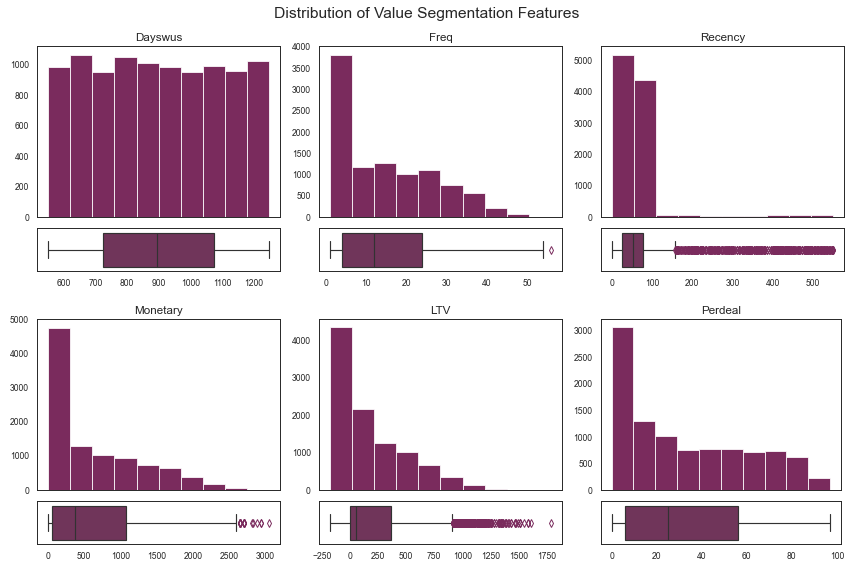

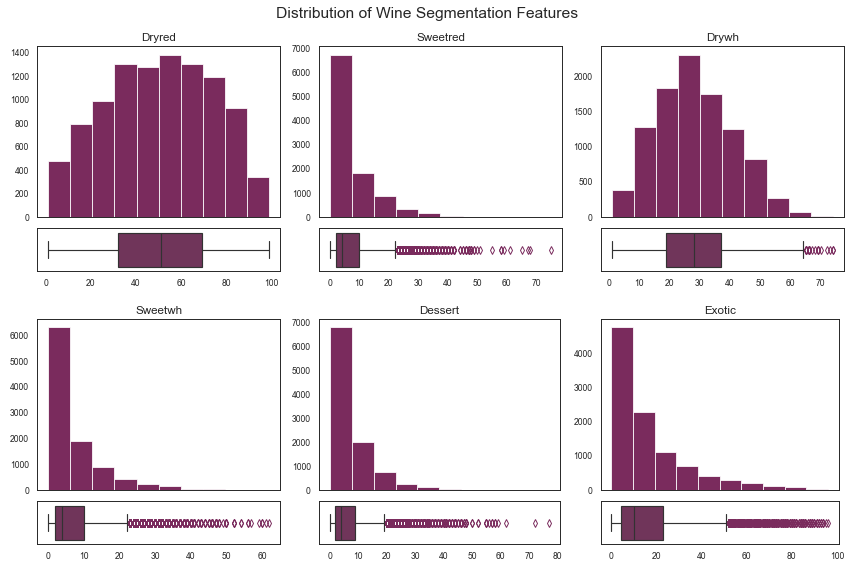

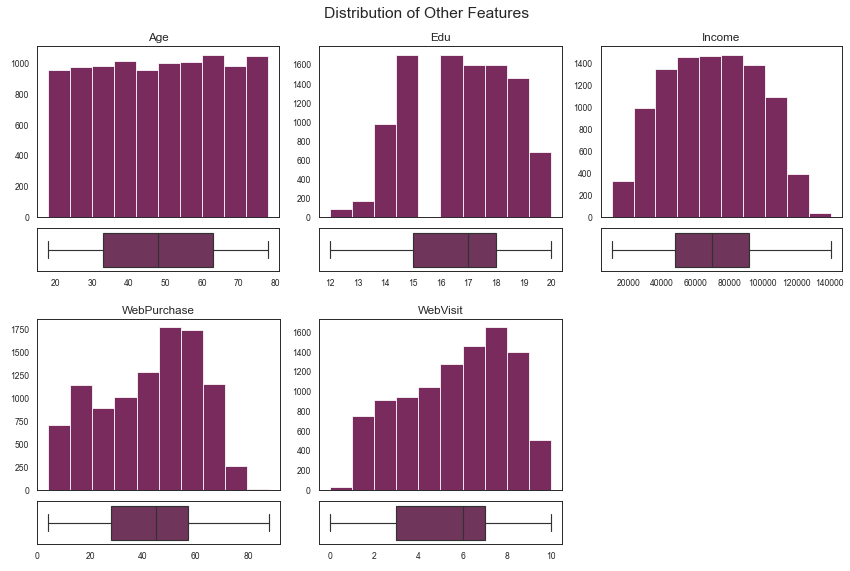

In [21]:
plot_histograms_boxplots(df, value_features, rows=2, title='Distribution of Value Segmentation Features')
plot_histograms_boxplots(df, wine_features, rows=2, title='Distribution of Wine Segmentation Features')
plot_histograms_boxplots(df, (demog_features+other_features), rows=2, title='Distribution of Other Features')

### Explore the Recency variable 

Because of it's unusual distribution

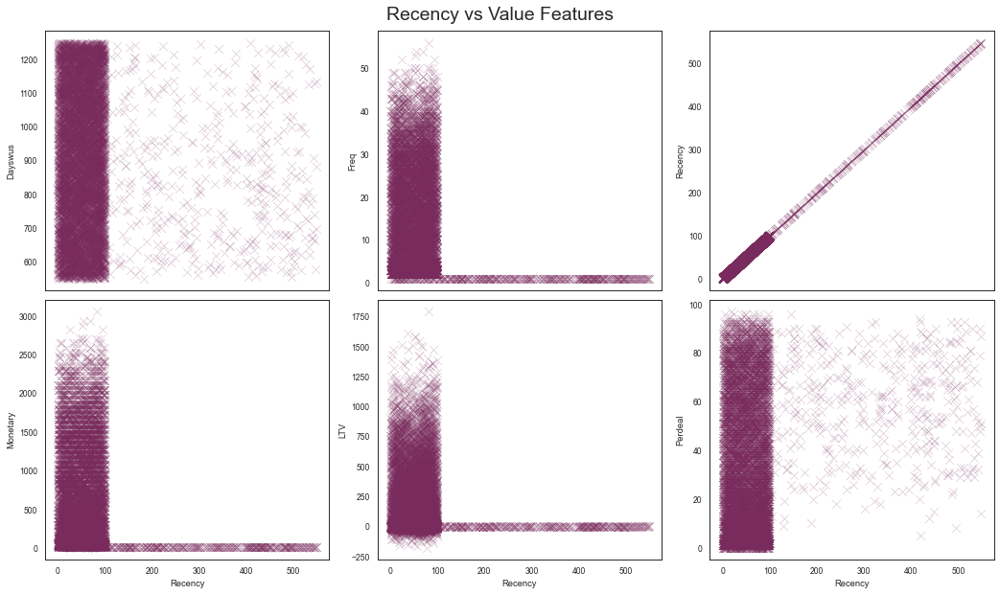

In [22]:
fig, axes = plt.subplots(2,round(len(value_features)/2),figsize=(15,9), sharex=True)

for f, ax in zip(range(len(value_features)),axes.flatten()):
    sns.scatterplot(data=df, x='Recency', y=value_features[f],
           alpha=.25, s=80, marker='x', palette=CAT_CMAP, 
                    ax=ax
           )
plt.suptitle('Recency vs Value Features', fontsize=20)
plt.tight_layout()
plt.show()

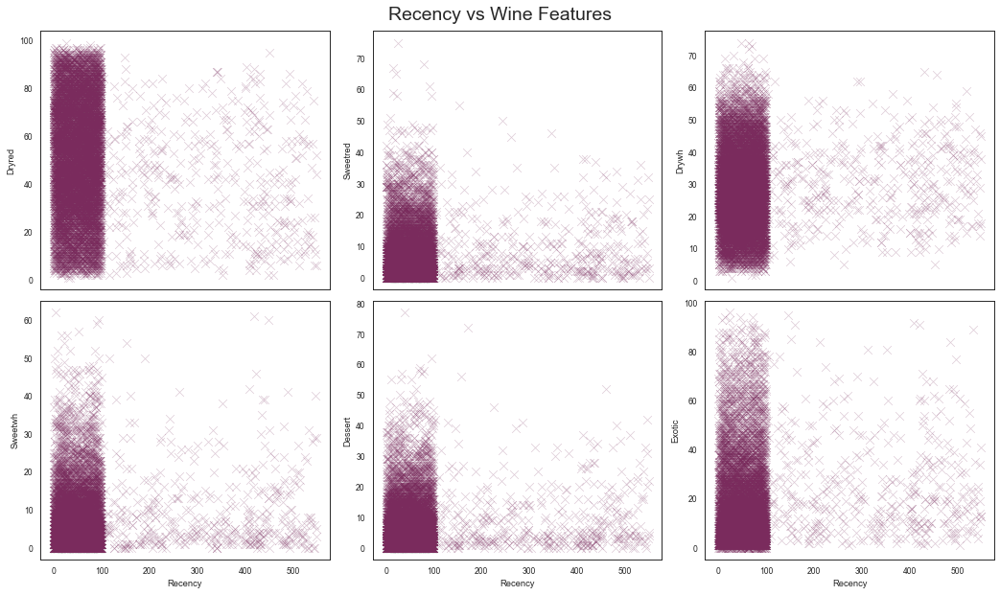

In [23]:
fig, axes = plt.subplots(2,round(len(wine_features)/2),figsize=(15,9), sharex=True)

for f, ax in zip(range(len(wine_features)),axes.flatten()):
    sns.scatterplot(data=df, x='Recency', y=wine_features[f],
           alpha=.25, s=80, marker='x', palette=CAT_CMAP, 
                    ax=ax
           )
plt.suptitle('Recency vs Wine Features', fontsize=20)
plt.tight_layout()
plt.show()

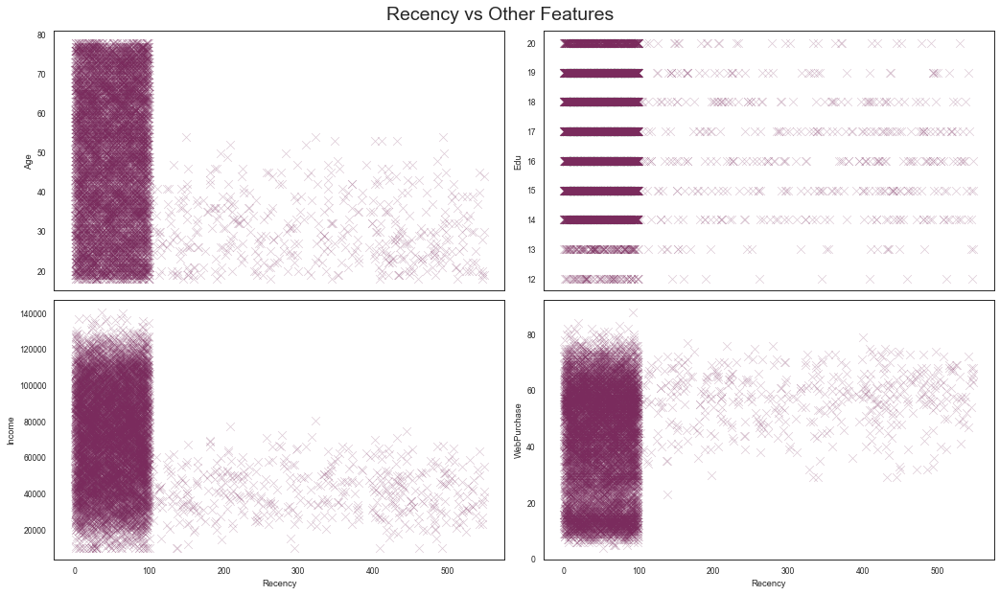

In [24]:
do_features = demog_features+other_features
fig, axes = plt.subplots(2,round(len(do_features)/2),figsize=(15,9), sharex=True)

for f, ax in zip(range(len(do_features)),axes.flatten()):
    sns.scatterplot(data=df, x='Recency', y=do_features[f],
           alpha=.25, s=80, marker='x', palette=CAT_CMAP, 
                    ax=ax
           )
plt.suptitle('Recency vs Other Features', fontsize=20)
plt.tight_layout()
plt.show()

Consider the points at Recency > 100 as "Lost Customers" in its own cluster. Observing in particular the relationship between Recency and Frequency, it appears that customers are unlikely to repurchase if their last transaction has been more than 100 days past.

### Visualize Component Planes

In [25]:
som_vars = value_features + wine_features + demog_features + other_features

## From Lab 11

np.random.seed(RANDOM_STATE)

sm = sompy.SOMFactory().build(
    df[som_vars].values, 
    mapsize=[15,15],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=som_vars
)
sm.train(n_job=4, train_rough_len=50, train_finetune_len=50)



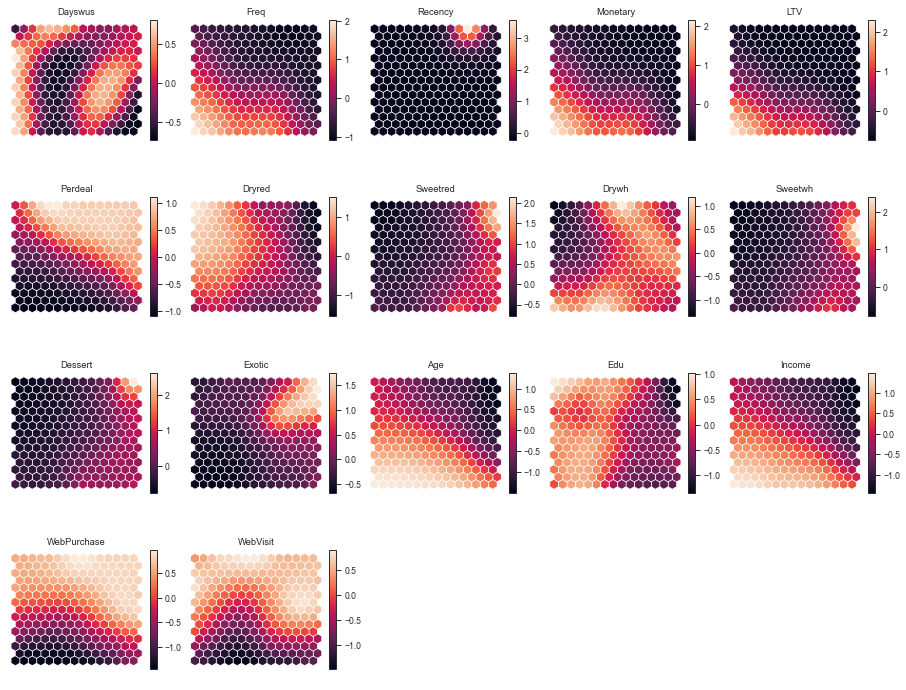

In [26]:
# Visualizing the Component planes (feature values)
view2D = View2D(2, 2, "", text_size=20)
view2D.show(sm, col_sz=5, what='codebook')

## Data Preparation

### Check for correlation

In [27]:
def make_corr_heatmap(df, method, title="Triangle Correlation Heatmap"):
    l = len(df.columns.tolist())
    fig = plt.figure(figsize=(2*l, 1.5*l))
    mask = np.triu(np.ones_like(df.corr(method=method), dtype=bool))
    heatmap = sns.heatmap(df.corr(method=method), mask=mask, vmin=-1, vmax=1, annot=True, fmt='.2f' ,cmap=DIV_CMAP)
    heatmap.set_title(title, fontdict={'fontsize':18}, pad=2);
    save_fig(title, fig)
    plt.show()

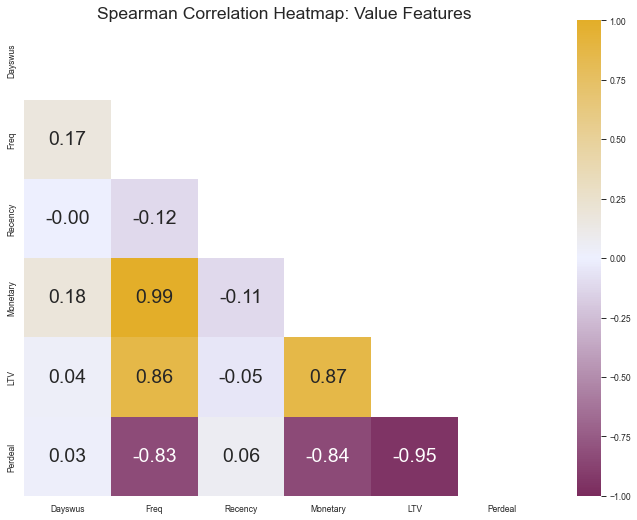

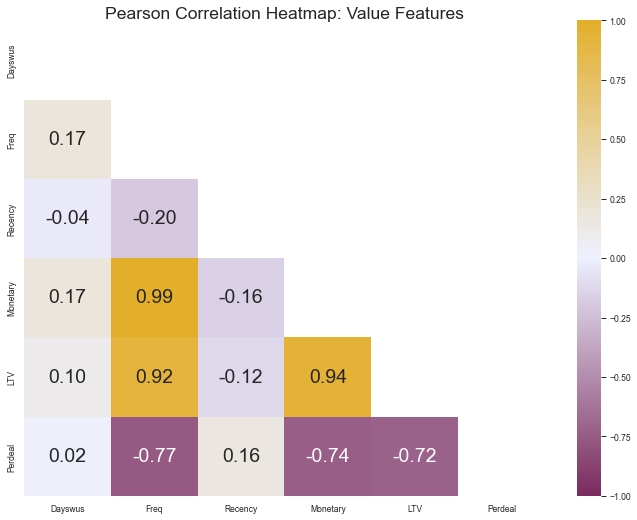

In [28]:
make_corr_heatmap(df[value_features], 'spearman', title="Spearman Correlation Heatmap: Value Features")
make_corr_heatmap(df[value_features], 'pearson', title="Pearson Correlation Heatmap: Value Features")


In [29]:
## Remove Perdeal because highly correlated with multiple feats
value_features.remove('Perdeal')
other_features.append('Perdeal')

## Remove Monetary because highly correlated with Freq, LTV
value_features.remove('Monetary')
other_features.append('Monetary')


## Remove Frequency and LTV because highly correlated with Monetary
value_features2 = ['Dayswus', 'Recency', 'Monetary']

value_features

['Dayswus', 'Freq', 'Recency', 'LTV']

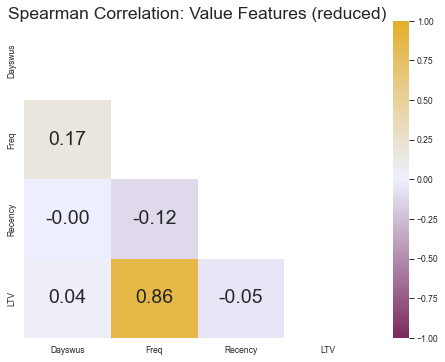

In [30]:
make_corr_heatmap(df[value_features], 'spearman', title="Spearman Correlation: Value Features (reduced)")


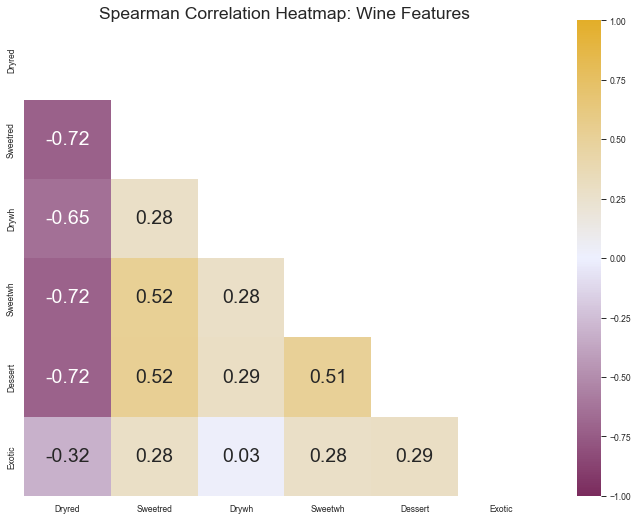

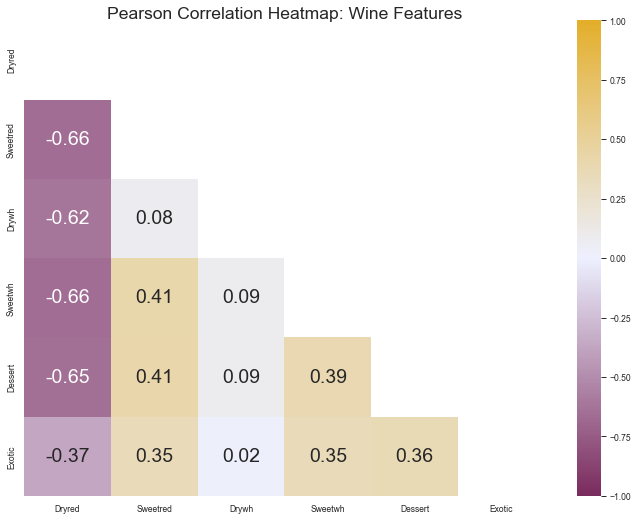

In [31]:
make_corr_heatmap(df[wine_features], 'spearman', title="Spearman Correlation Heatmap: Wine Features")
make_corr_heatmap(df[wine_features], 'pearson', title="Pearson Correlation Heatmap: Wine Features")


### Check for outliers

In [32]:
for v in df.columns.tolist():
    getIQR(df, v)

363 or 3.63% of rows are above the UL [Recency].
117 or 1.17% of rows are above the UL [LTV].
358 or 3.58% of rows are above the UL [Sweetred].
2 or 0.02% of rows are above the UL [Drywh].
365 or 3.65% of rows are above the UL [Sweetwh].
474 or 4.74% of rows are above the UL [Dessert].
331 or 3.31% of rows are above the UL [Exotic].


Too many outliers to remove just based on IQR

In [33]:
df['Outlier'] = 0

In [34]:
df.loc[df['Dessert']>70,['Outlier']] = 1
df.loc[df['Sweetred']>70,['Outlier']] = 1

In [35]:
df.loc[df['Freq']>55,['Outlier']] = 1
df.loc[df['LTV']>1750,['Outlier']] = 1

In [36]:
df_hasoutliers = df.copy()

In [37]:
df = df[df['Outlier']==0]

In [38]:
df_outliers = df[df['Outlier']==1]

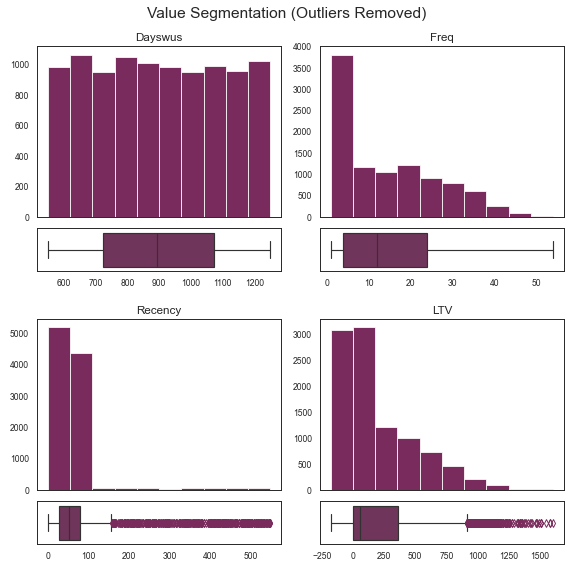

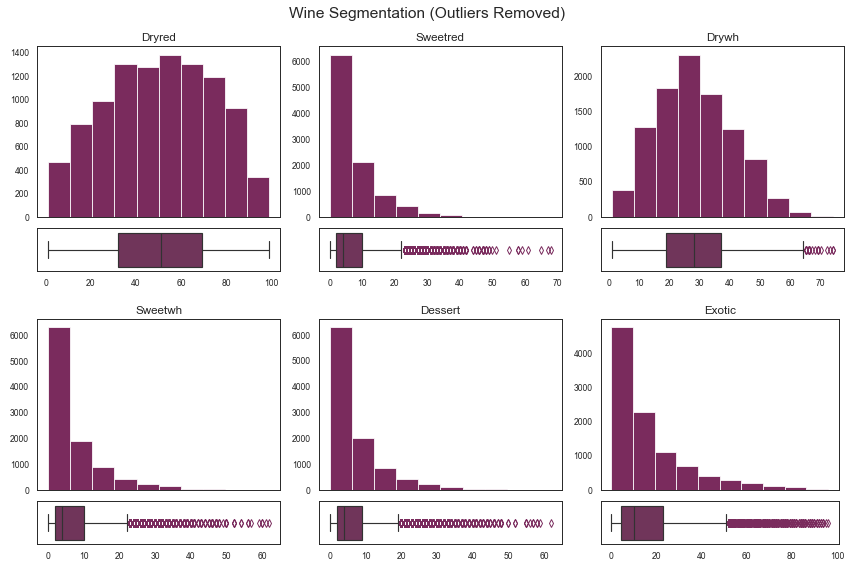

In [39]:
plot_histograms_boxplots(df, value_features, rows=2, title='Value Segmentation (Outliers Removed)')
plot_histograms_boxplots(df, wine_features, rows=2, title='Wine Segmentation (Outliers Removed)')

## Transform Variables

In [40]:
##### Uncomment to separate out the 'Lost' Customers cluster
# df = df.loc[df['Recency']<=100,:]

### MinMax Scaler

We only scale the Value Segmentation Features because the Wine Segmentation Features are all in the same scale (percentage) already.

In [41]:
mmscaler = MinMaxScaler()

value_feats_mm = value_features.copy()

for fi in range(len(value_feats_mm)):
    t = value_feats_mm[fi] + '_mm'
    value_feats_mm[fi] = t
    df[t] = df[value_features[fi]]

df[value_feats_mm] = mmscaler.fit_transform(df[value_feats_mm])


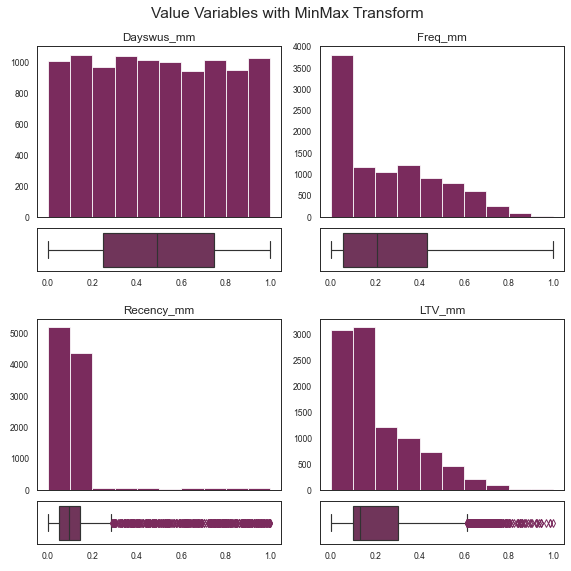

In [42]:
plot_histograms_boxplots(df, value_feats_mm, rows=2, title='Value Variables with MinMax Transform')


### Transform wine features to decimal (from percentage)

In [43]:
wine_feats_dec = wine_features.copy()

for fi in range(len(wine_feats_dec)):
    t = wine_feats_dec[fi] + '_dec'
    wine_feats_dec[fi] = t
    df[t] = df[wine_features[fi]]/100


## Use DBSCAN to identify 'noise' rows

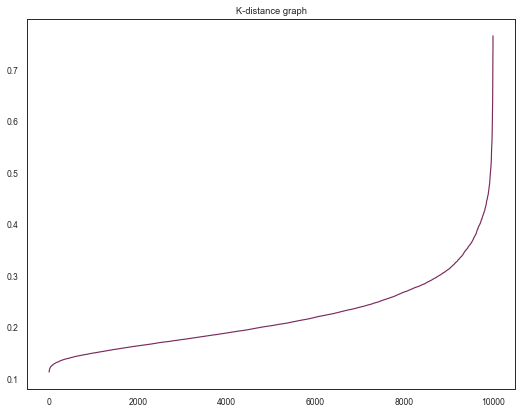

In [44]:
vars_ = wine_feats_dec + value_feats_mm
neigh = NearestNeighbors(n_neighbors=50)
neigh.fit(df[vars_])
distances, _ = neigh.kneighbors(df[vars_])
distances = np.sort(distances[:, -1])

fig, axis = plt.subplots(figsize=(9,7))
plt.plot(distances, color=COLORS[0])
plt.title('K-distance graph')
plt.show()

save_fig('K-distance graph', fig)

In [45]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=.35, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df[vars_])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


In [46]:
# Concatenating the labels to df
df_dbscan = pd.concat([df[vars_], pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_dbscan.groupby(['dbscan_labels']).count()

,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm
dbscan_labels,,,,,,,,,,
-1,30,30,30,30,30,30,30,30,30,30
0,9966,9966,9966,9966,9966,9966,9966,9966,9966,9966


In [47]:
df_ = pd.concat([df, pd.Series(dbscan_labels, index=df.index, name="Noise")], axis=1)
df_noise = df_.loc[df_['Noise'] == -1]
df = df_.loc[df_['Noise'] != -1]
df_nonoise = df_.loc[df_['Noise'] != -1]


In [48]:
df.drop(columns=['Noise'], inplace=True)
df

,Dayswus,Age,Edu,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,...,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec
Custid,,,,,,,,,,,,,,,,,,,,,
5325,653.0,55.0,20.0,78473.0,20.0,18.0,826.0,445.0,7.0,67.0,...,0.147143,0.358491,0.032787,0.348824,0.67,0.04,0.26,0.02,0.01,0.01
3956,1041.0,75.0,18.0,105087.0,36.0,33.0,1852.0,539.0,2.0,49.0,...,0.701429,0.660377,0.060109,0.401456,0.49,0.00,0.46,0.01,0.03,0.00
3681,666.0,18.0,12.0,27984.0,4.0,56.0,39.0,-7.0,88.0,4.0,...,0.165714,0.056604,0.102004,0.095745,0.04,0.29,0.14,0.32,0.21,0.48
2829,1049.0,42.0,16.0,61748.0,2.0,46.0,37.0,-6.0,70.0,86.0,...,0.712857,0.018868,0.083789,0.096305,0.86,0.01,0.11,0.01,0.01,0.55
8788,837.0,47.0,16.0,65789.0,2.0,3.0,36.0,4.0,35.0,85.0,...,0.410000,0.018868,0.005464,0.101904,0.85,0.00,0.12,0.02,0.01,0.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,1132.0,57.0,20.0,81033.0,19.0,59.0,776.0,187.0,22.0,78.0,...,0.831429,0.339623,0.107468,0.204367,0.78,0.00,0.20,0.01,0.01,0.11
4070,596.0,66.0,15.0,84714.0,18.0,45.0,720.0,391.0,5.0,30.0,...,0.065714,0.320755,0.081967,0.318589,0.30,0.12,0.36,0.10,0.12,0.13
7909,619.0,18.0,12.0,40466.0,3.0,65.0,47.0,5.0,23.0,6.0,...,0.098571,0.037736,0.118397,0.102464,0.06,0.24,0.10,0.38,0.22,0.41


In [49]:
print('Percentage of rows considered noise:')
100*len(df_dbscan.loc[df_dbscan['dbscan_labels'] == -1])/len(df)

Percentage of rows considered noise:


0.30102347983142685

In [50]:
len(df_noise.loc[df_noise['Recency']>100,:])/len(df_noise)

0.9

## Summary of Variables

In [51]:
## Original value features
print(value_features)
df[value_features].head(3)

['Dayswus', 'Freq', 'Recency', 'LTV']


,Dayswus,Freq,Recency,LTV
Custid,,,,
5325,653.0,20.0,18.0,445.0
3956,1041.0,36.0,33.0,539.0
3681,666.0,4.0,56.0,-7.0


In [52]:
## Original wine features
print(wine_features)
df[wine_features].head(3)

['Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic']


,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic
Custid,,,,,,
5325,67.0,4.0,26.0,2.0,1.0,1.0
3956,49.0,0.0,46.0,1.0,3.0,0.0
3681,4.0,29.0,14.0,32.0,21.0,48.0


In [53]:
## MinMax transformed value features
print(value_feats_mm)
df[value_feats_mm].head(3)

['Dayswus_mm', 'Freq_mm', 'Recency_mm', 'LTV_mm']


,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm
Custid,,,,
5325,0.147143,0.358491,0.032787,0.348824
3956,0.701429,0.660377,0.060109,0.401456
3681,0.165714,0.056604,0.102004,0.095745


In [54]:
## Decimal wine features
print(wine_feats_dec)
df[wine_feats_dec].head(3)

['Dryred_dec', 'Sweetred_dec', 'Drywh_dec', 'Sweetwh_dec', 'Dessert_dec', 'Exotic_dec']


,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec
Custid,,,,,,
5325,0.67,0.04,0.26,0.02,0.01,0.01
3956,0.49,0.00,0.46,0.01,0.03,0.00
3681,0.04,0.29,0.14,0.32,0.21,0.48


# Clustering

## RFM Analysis

In [55]:
bins = 5
rfm_df = df.loc[df['Recency']<=100,:]
rfm_df['Recency_Rank'] = bins - pd.qcut(rfm_df['Recency'], bins, labels=False)
rfm_df['Frequency_Rank'] = 1 + pd.qcut(rfm_df['Freq'], bins, labels=False)
rfm_df['Monetary_Rank'] = 1+ pd.qcut(rfm_df['Monetary'], bins, labels=False)
rfm_df['RFM_Ave'] = rfm_df.loc[:,['Recency_Rank','Frequency_Rank','Monetary_Rank']].mean(axis=1)



In [56]:
bins = 5
df['Recency_Rank'] = 0
df['Frequency_Rank'] = 0
df['Monetary_Rank'] = 0

df.loc[df['Recency']<=100,'Recency_Rank'] = bins - \
    pd.qcut(df.loc[df['Recency']<=100,'Recency'], bins, labels=False)



df.loc[df['Recency']<=100,'Frequency_Rank'] = 1 + pd.qcut(df.loc[df['Recency']<=100,'Freq'], bins, labels=False)
df.loc[df['Recency']<=100,'Monetary_Rank'] = 1+ pd.qcut(df.loc[df['Recency']<=100,'Monetary'], bins, labels=False)

#df.loc[df['Recency']<=100,'RFM_Ave'] = df.loc[df['Recency']<=100,['Recency_Rank','Frequency_Rank','Monetary_Rank']].mean(axis=1)

df['RFM_Ave'] = df.loc[:,['Recency_Rank','Frequency_Rank','Monetary_Rank']].mean(axis=1)


In [57]:
df.loc[:,['Recency','Recency_Rank','Freq','Frequency_Rank','Monetary_Rank','RFM_Ave']]

,Recency,Recency_Rank,Freq,Frequency_Rank,Monetary_Rank,RFM_Ave
Custid,,,,,,
5325,18.0,5,20.0,4,4,4.333333
3956,33.0,4,36.0,5,5,4.666667
3681,56.0,3,4.0,1,1,1.666667
2829,46.0,3,2.0,1,1,1.666667
8788,3.0,5,2.0,1,1,2.333333
...,...,...,...,...,...,...
1383,59.0,3,19.0,4,4,3.666667
4070,45.0,3,18.0,4,4,3.666667
7909,65.0,2,3.0,1,1,1.333333


In [58]:
rfm_rank_features = ['Frequency_Rank', 'Recency_Rank', 'Monetary_Rank', 'RFM_Ave']
rfm_features = ['Freq', 'Recency', 'Monetary',]


In [59]:
quantile_values = [rfm_df['Recency'].quantile(i) for i in [.2,.4,.6,.8]]
freq_quints = [rfm_df['Freq'].quantile(i) for i in [.2,.4,.6,.8]]

#quantile_values
#freq_quints

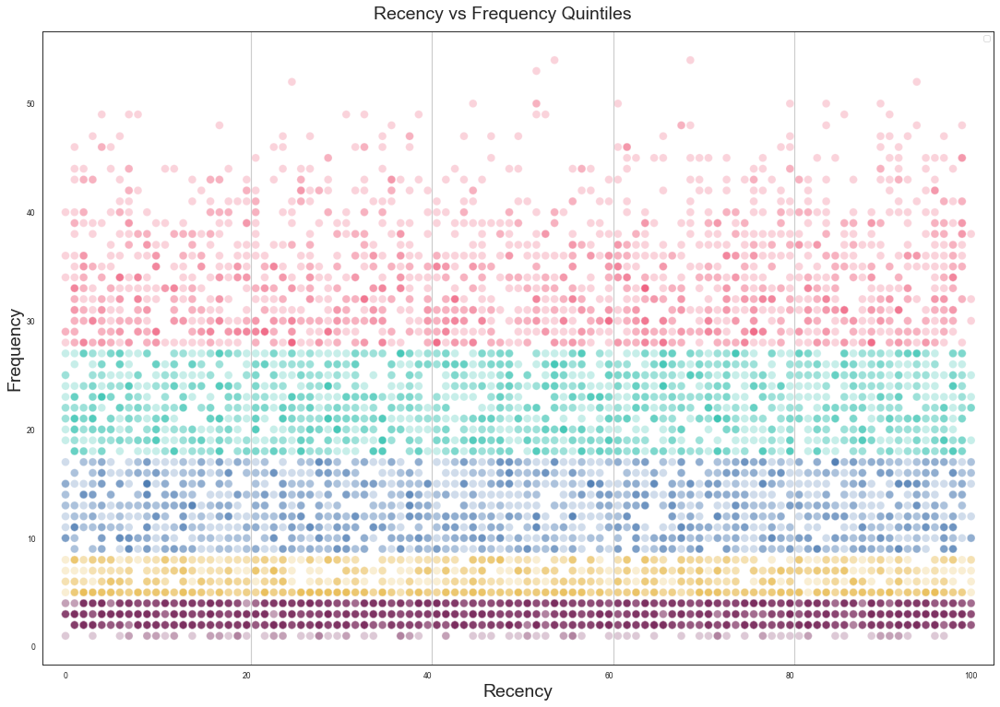

In [60]:
fig, ax = plt.subplots(figsize=(19,13))

for q in range(len(quantile_values)):
    ax.axvline(quantile_values[q]+.49, 
               label=str(int(quantile_values[q]))+'th Percentile', 
               color='#CCCCCC')
    
    #ax.axhline(freq_quints[q]+.5, 
    #           label=str(int(quantile_values[q]))+'th Percentile', 
    #           color='#CCCCCC')
    
scatter = sns.scatterplot(data=rfm_df, x='Recency', y='Freq', hue='Frequency_Rank', 
           alpha=.25, s=80, marker='o', palette=CAT_CMAP,
                          #style='Recency_Rank'
                         )

ax.set_ylabel('Frequency', fontsize=20)
ax.set_xlabel('Recency', fontsize=20)


ax.legend([])
rfm_title='Recency vs Frequency Quintiles'

plt.suptitle(rfm_title, fontsize=20, y=.91)
plt.margins(0.025, 0.05)
if SAVE_PLOTS:
    save_fig(rfm_title, fig)
plt.show()

## Some helpful functions

In [61]:
## Code from Lab #13

def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2_(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst

def r2(dft, df, labels, feats):
    sst = get_ss(dft[feats])
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst

def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2_(df, labels)
    return r2_clust


def showR2Plot(r2_scores, title=""):
    # Visualizing the R² scores for each cluster solution on demographic variables
    fig, ax = plt.subplots(figsize=(10,7))
    pd.DataFrame(r2_scores).plot(ax=ax)
    plt.title("R² Plot: " + title)
    ax.set_xlabel("Number of clusters")
    ax.set_ylabel("R² metric")
    save_fig('R2_Plot_'+ title, fig)
    plt.show()


In [62]:
def show_cluster_heatmap(df, label1, cols, title='Heatmap of Cluster Means', cluster_labels=[]):
    fig, ax = plt.subplots(constrained_layout=True , figsize=(len(cols)*1.3,len(cols)*.7), sharey=True)
    
    label_counts = df.groupby(label1)[label1].count()
    df_i = df.groupby(label1)[cols].mean().index
    
    
    if len(cluster_labels) == 0:
        cluster_labels = df_i
    
    xticks = [(str(cluster_labels[l]) + "\n" + str(label_counts[l])) for l in range(len(label_counts))]
    
    sns.heatmap(df.groupby(label1)[cols].mean().loc[df_i,:].T, \
            vmin=0, vmax=1,
            cmap=DIV_CMAP, xticklabels=xticks, annot=True, fmt='.2f', annot_kws={"fontsize":14})

    k = len(df[label1].unique().tolist())
    
    ax.set_xlabel(('Cluster Sizes and Labels, K = '+str(k)))
    fig.suptitle(title, y=1.1, fontsize=20)
    
    if SAVE_PLOTS:
        save_fig(title, fig)
    
    plt.show()


In [63]:
def compare_cluster_heatmap(df, k1, k2, label1, label2, cols, title='Heatmap of Cluster Means'):
    fig, ax = plt.subplots(1,2,gridspec_kw={'width_ratios': [k1, k2]} ,\
                           constrained_layout=True , figsize=(14,len(cols)*.8), sharey=True)
    
    label_counts = df.groupby(label1)[label1].count()
    
    xticks = [(str(l) + "\n" + str(label_counts[l])) for l in range(len(label_counts))]
    sns.heatmap(df.groupby(label1)[cols].mean().loc[range(0,k1),:].T, \
            vmin=0, vmax=1,\
            cmap=DIV_CMAP, ax=ax[0], xticklabels=xticks, annot=True, fmt='.2f', annot_kws={"fontsize":16})

    label_counts = df.groupby(label2)[label2].count()
    
    xticks = [(str(l) + "\n" + str(label_counts[l])) for l in range(len(label_counts))]
    sns.heatmap(df.groupby(label2)[cols].mean().loc[range(0,k2),:].T, \
            vmin=0, vmax=1,\
            cmap=DIV_CMAP, ax=ax[1], xticklabels=xticks, annot=True, fmt='.2f', annot_kws={"fontsize":16})

    ax[0].set_xlabel('Cluster Sizes and Labels, K='+str(k1))
    ax[1].set_xlabel('Cluster Sizes and Labels, K='+str(k2))
    fig.suptitle(title, y=1.1, fontsize=20)
    save_fig(title, fig)
    
    plt.show()


In [64]:
def show_elbow_silhouette(df, features, max_k=40):
    n_clusters = range(2,max_k)
    silhouette_scores = []
    sum_squared_dist = []
    r_scores = []
    
    for num_clusters in n_clusters:
        kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=1500,n_init=100,random_state=RANDOM_STATE)
        
        kmeans.fit(df[features])
        cluster_labels = kmeans.labels_
        sum_squared_dist.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(df[features], cluster_labels,\
                                                  metric='euclidean', \
                                                  sample_size=None, random_state=None))
        df['labels'] = cluster_labels
        r_scores.append(r2_(df, 'labels'))
    
    fig, ax1 = plt.subplots(figsize=(11,7))
    ax2 = ax1.twinx()

    ax1.plot(n_clusters,sum_squared_dist, color=CAT_COLORS[0], label='Inertia')

    #ax2.plot(n_clusters, r_scores, color=CAT_COLORS[2], label='R2' )
    
    ax1.set_xlabel('Values of K')
    ax1.set_ylabel('Inertia', color=COLORS[0])
    
    #ax2.set_ylabel('R2 Score', color=CAT_COLORS[2])
    #ax2.yaxis.set_label_coords(.97, 0.5)
    
    kl = KneeLocator(range(1, len(sum_squared_dist)+1), sum_squared_dist, curve="convex", direction="decreasing")
    ax1.axvline(x=kl.elbow, label='Elbow', color=CAT_COLORS[0], linestyle='dashed')
    
    fig.legend(loc="center right", bbox_to_anchor=(.85, .5))
    plt.xticks(range(1,max_k+1,2))
    plt.title('Inertia Plot')
    save_fig('Inertia R2 Plot', fig)
    
    

    plt.show()

    print('Knee located at k=', kl.elbow)
    


In [65]:
def plot_clusters(df, labels, title='Cluster Visualization', label_map=None):    
    l = labels
    if label_map:
        l2 = labels.copy()
        lmap = {}
        for i in range(len(label_map)):
            lmap[label_map[i]] = i
        l = l2.replace(lmap)
        
    fig, ax = plt.subplots(figsize=(10,10))

    scatter = ax.scatter(x=df[0], y=df[1], c=l, cmap=CAT_CMAP,\
               s=2, marker="o", alpha=.75, label='Final Clusters')

    ncol = len(labels.unique().tolist())
    ncol = round(ncol/2) + 1 if ncol > 7 else ncol
    if label_map == None:
        legend1 = ax.legend(*scatter.legend_elements(),
                        bbox_to_anchor=(.5,1,.5,1), loc="lower left", frameon=False,
                        mode='expand', borderaxespad=0, ncol=ncol,
                       )

    ax.set_xticklabels('')
    ax.set_yticklabels('')
    plt.title(title, loc='left')
    
    if SAVE_PLOTS:
        save_fig(title, fig)

    plt.show()

In [66]:
## Code based from Lab 09
def plot_dendrogram(model, title, **kwargs):
    sns.set_palette(CAT_PALETTE)

    # Create linkage matrix and then plot the dendrogram
    
    fig, ax = plt.subplots(figsize=(11,5))
    
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    
    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    
    plt.hlines(kwargs['color_threshold'], 0, 1000, colors="r", linestyles="dashed")
    
    
    plt.xticks(rotation=90)
    plt.title(title)

    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    save_fig(title, fig)
    plt.show()
    
    sns.set_palette(DEFAULT_PALETTE)
    


In [67]:
## Scoring
r_scores_wine = pd.DataFrame(columns=['method','r2','clusters'])
r_scores_value = pd.DataFrame(columns=['method','r2','clusters'])


## Wine Segmentation

In [68]:
df_wine_kmeans = df_nonoise[wine_feats_dec].copy() 

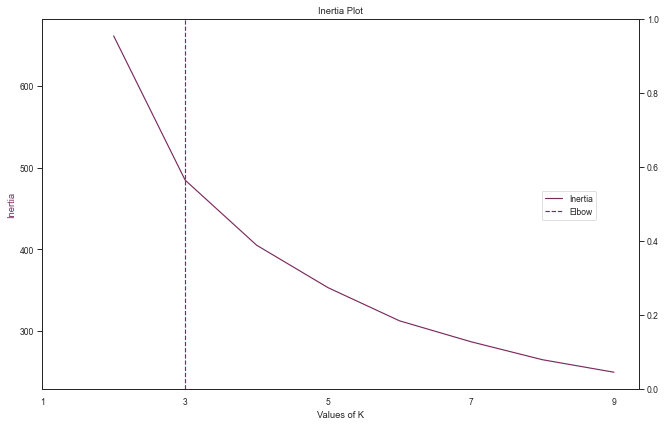

Knee located at k= 3


In [69]:
show_elbow_silhouette(df_wine_kmeans, wine_feats_dec, max_k=10)

In [70]:
#show_elbow_silhouette(df_wine_kmeans, wine_feats_dec, max_k=20)

In [71]:
df_wk = df_wine_kmeans.copy()

for k in range(2,10):
    wine_kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=1000, n_init=30, random_state=RANDOM_STATE)
    wine_k_labels = wine_kmeans.fit_predict(df_wk)

    df_wk['wine_'+str(k)] = wine_k_labels
    r2_(df_wk[wine_feats_dec+['wine_'+str(k)]],'wine_'+str(k))

    r_append = {
        'method': 'kmeans',
        'r2': r2_(df_wk[wine_feats_dec+['wine_'+str(k)]],'wine_'+str(k)),
        'clusters':k
    }
    r_scores_wine = r_scores_wine.append(r_append, ignore_index=True)




### Compare cluster means of different K

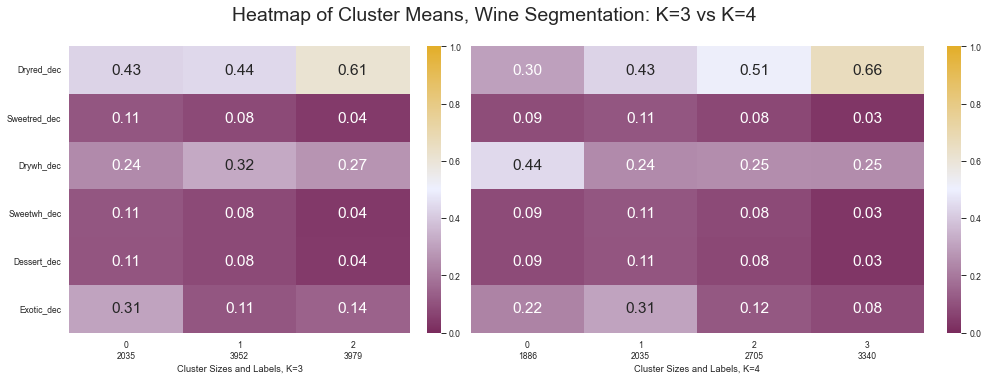

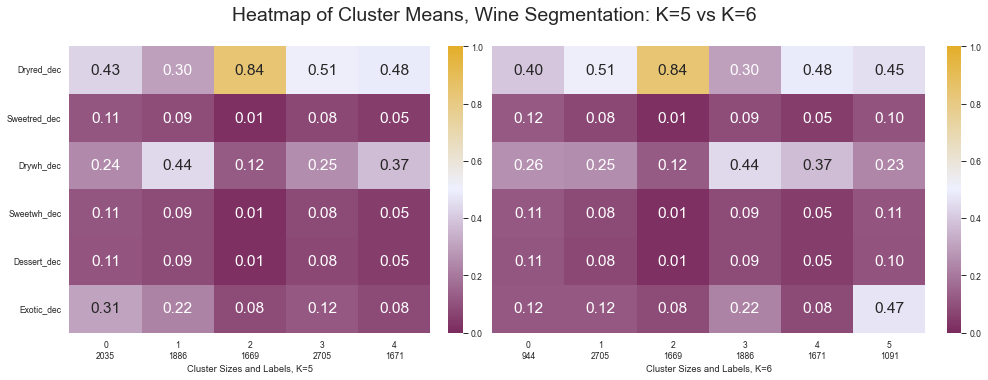

In [72]:
compare_cluster_heatmap(df_wk, 3, 4, 'wine_3', 'wine_4', wine_feats_dec, 'Heatmap of Cluster Means, Wine Segmentation: K=3 vs K=4')

compare_cluster_heatmap(df_wk, 5, 6, 'wine_5', 'wine_6', wine_feats_dec, 'Heatmap of Cluster Means, Wine Segmentation: K=5 vs K=6')



### Characterize final wine segmentation clusters

In [73]:
r_scores_wine

,method,r2,clusters
0,kmeans,0.698357,2
1,kmeans,0.850825,3
2,kmeans,0.937769,4
3,kmeans,0.966988,5
4,kmeans,0.974940,6
5,kmeans,0.984187,7
6,kmeans,0.991201,8
7,kmeans,0.995349,9


In [74]:
if SAVE_PLOTS:
    r_scores_wine.to_csv('../../out/data/r_scores_wine.csv')

In [75]:
wine_k = 3
wine_kmeans = KMeans(n_clusters=wine_k, init='k-means++', max_iter=1000000, n_init=30, random_state=RANDOM_STATE)
wine_k_labels = wine_kmeans.fit_predict(df_wine_kmeans)

df_wine_kmeans['wine_labels'] = wine_k_labels
r2_(df_wine_kmeans,'wine_labels')


0.8984956072253663

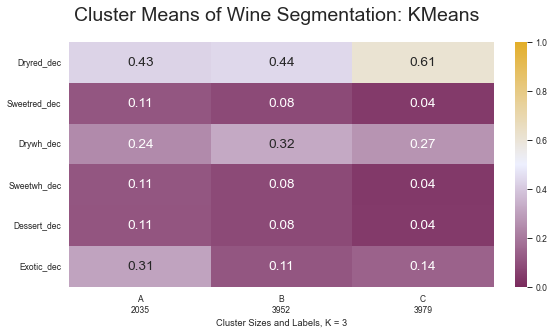

In [76]:
show_cluster_heatmap(df_wine_kmeans, 'wine_labels', wine_feats_dec, 'Cluster Means of Wine Segmentation: KMeans', ["A","B","C"])


### Visualize wine segmentation clusters

In [77]:
wine_tsne = TSNE(random_state=RANDOM_STATE).fit_transform(df_wine_kmeans[wine_feats_dec])

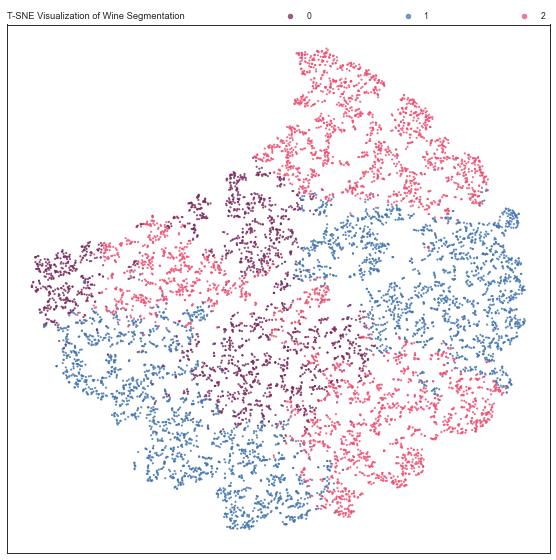

In [78]:
tsne_wine_df = pd.DataFrame(wine_tsne)
plot_clusters(tsne_wine_df, df_wine_kmeans['wine_labels'], 'T-SNE Visualization of Wine Segmentation')

In [79]:
wine_umap = umap.UMAP(random_state=RANDOM_STATE, metric='euclidean', min_dist=1, n_neighbors=150, n_components=2)\
                    .fit_transform(df_wine_kmeans[wine_feats_dec])
umap_wine_df = pd.DataFrame(wine_umap)

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


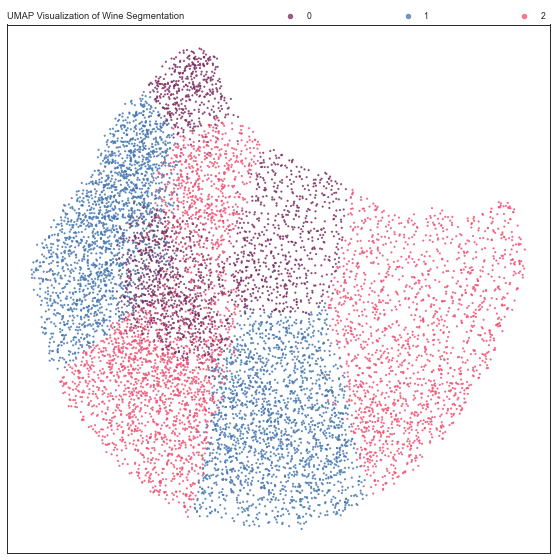

In [80]:
plot_clusters(umap_wine_df, df_wine_kmeans['wine_labels'], 'UMAP Visualization of Wine Segmentation')

## Value Segmentation

In [81]:
df_value_kmeans = df[value_feats_mm].copy()
df_value_hclust = df[value_feats_mm].copy()

In [82]:
#show_elbow_silhouette(df_value_kmeans, value_feats_mm, max_k=20)

In [83]:
value_k = 4
value_kmeans = KMeans(n_clusters=value_k, init='k-means++', n_init=100, random_state=RANDOM_STATE)
value_k_labels = value_kmeans.fit_predict(df_value_kmeans)
df_value_kmeans['value_labels'] = value_k_labels


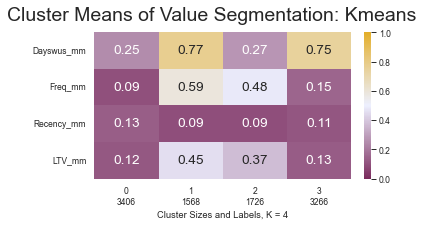

In [84]:
show_cluster_heatmap(df_value_kmeans, 'value_labels', value_feats_mm, 'Cluster Means of Value Segmentation: Kmeans')

In [85]:
r2_(df_value_kmeans,'value_labels')

0.9686037696186998

In [86]:
linkage = 'ward'
distance = 'euclidean'
value_hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=value_k)
value_labels = value_hclust.fit_predict(df_value_hclust)

df_value_hclust['value_labels'] = value_labels


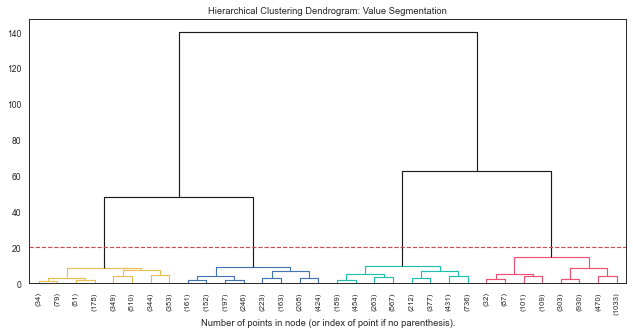

In [87]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_value_hclust)
plot_dendrogram(hclust, title='Hierarchical Clustering Dendrogram: Value Segmentation',\
                truncate_mode="level", p=4, \
                above_threshold_color='k', color_threshold=20)

In [88]:
df_vh = df_value_kmeans.copy()

for k in range(2,10):
    value_hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=k)
    value_h_labels = value_hclust.fit_predict(df_vh)

    df_vh['value_'+str(k)] = value_h_labels

    r_append = {
        'method': 'hclust',
        'r2': r2_(df_vh[value_feats_mm+['value_'+str(k)]],'value_'+str(k)),
        'clusters':k
    }
    r_scores_value = r_scores_value.append(r_append, ignore_index=True)


#r_scores_value

In [89]:
df_vk = df_value_kmeans.copy()

for k in range(2,10):
    value_kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=1000, n_init=30, random_state=RANDOM_STATE)
    value_k_labels = value_kmeans.fit_predict(df_vk)

    df_vk['value_'+str(k)] = value_k_labels

    r_append = {
        'method': 'kmeans',
        'r2': r2_(df_vk[value_feats_mm+['value_'+str(k)]],'value_'+str(k)),
        'clusters':k
    }
    r_scores_value = r_scores_value.append(r_append, ignore_index=True)


#r_scores_value

### Characterize value segmentation clusters

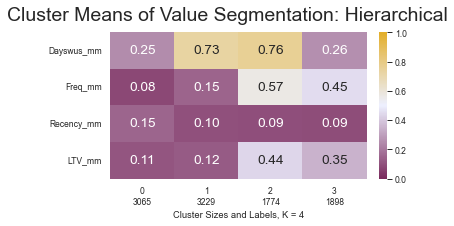

In [90]:
show_cluster_heatmap(df_value_hclust, 'value_labels', value_feats_mm, 'Cluster Means of Value Segmentation: Hierarchical')

### Visualize Value Segmentation

In [91]:
value_tsne = TSNE(random_state=RANDOM_STATE).fit_transform(df_value_hclust[value_feats_mm])

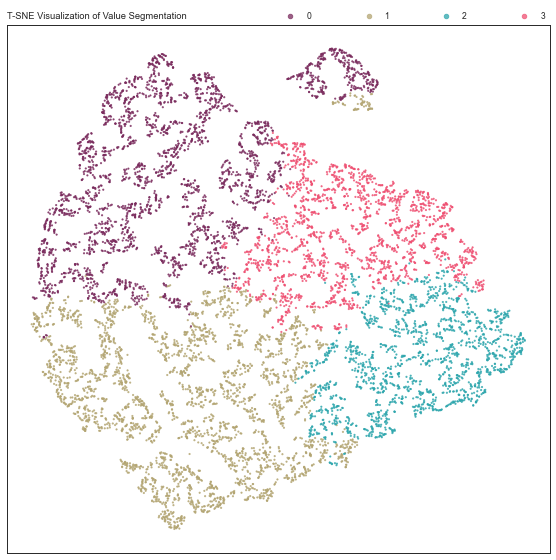

In [92]:
tsne_value_df = pd.DataFrame(value_tsne)
plot_clusters(tsne_value_df, df_value_hclust['value_labels'], 'T-SNE Visualization of Value Segmentation')

In [93]:
value_umap = umap.UMAP(random_state=RANDOM_STATE, metric='euclidean', min_dist=1, n_neighbors=150, n_components=2)\
                    .fit_transform(df_value_hclust[value_feats_mm])
umap_value_df = pd.DataFrame(value_umap)

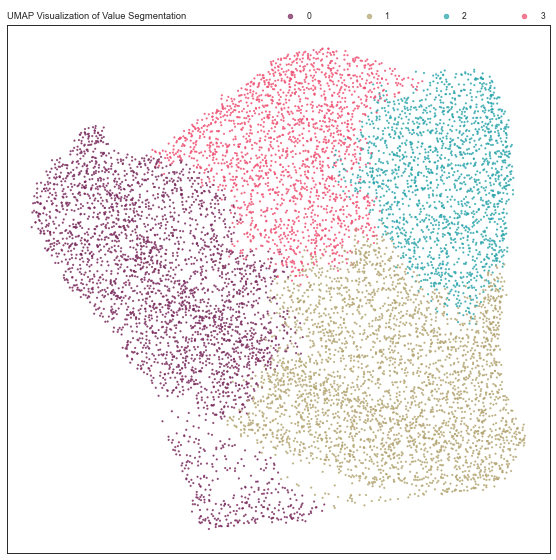

In [94]:
plot_clusters(umap_value_df, df_value_hclust['value_labels'], 'UMAP Visualization of Value Segmentation')


## Merging cluster solutions

In [95]:
rfm_df[rfm_features]

,Freq,Recency,Monetary
Custid,,,
5325,20.0,18.0,826.0
3956,36.0,33.0,1852.0
3681,4.0,56.0,39.0
2829,2.0,46.0,37.0
8788,2.0,3.0,36.0
...,...,...,...
7989,4.0,33.0,59.0
1383,19.0,59.0,776.0
4070,18.0,45.0,720.0


In [96]:
df_merged = pd.merge(df_value_hclust, df_wine_kmeans, left_index=True, right_index=True)
#df_merged = pd.merge(df_merged, rfm_df[rfm_features + rfm_rank_features], left_index=True, right_index=True)

df_merged

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,value_labels,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels
Custid,,,,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,3,0.67,0.04,0.26,0.02,0.01,0.01,0,1
3956,0.701429,0.660377,0.060109,0.401456,2,0.49,0.00,0.46,0.01,0.03,0.00,4,2
3681,0.165714,0.056604,0.102004,0.095745,0,0.04,0.29,0.14,0.32,0.21,0.48,6,0
2829,0.712857,0.018868,0.083789,0.096305,1,0.86,0.01,0.11,0.01,0.01,0.55,7,0
8788,0.410000,0.018868,0.005464,0.101904,0,0.85,0.00,0.12,0.02,0.01,0.28,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,1,0.78,0.00,0.20,0.01,0.01,0.11,5,2
4070,0.065714,0.320755,0.081967,0.318589,3,0.30,0.12,0.36,0.10,0.12,0.13,2,1
7909,0.098571,0.037736,0.118397,0.102464,0,0.06,0.24,0.10,0.38,0.22,0.41,6,0


In [97]:
#df_merged = df_value_hclust.copy()
#df_merged = df_merged.merge(df_wine_kmeans, left_index=True, right_index=True )

In [98]:
df_merged
df_merged.columns

Index(['Dayswus_mm', 'Freq_mm', 'Recency_mm', 'LTV_mm', 'value_labels',
       'Dryred_dec', 'Sweetred_dec', 'Drywh_dec', 'Sweetwh_dec', 'Dessert_dec',
       'Exotic_dec', 'labels', 'wine_labels'],
      dtype='object')

In [99]:
r_scores_value.sort_values(by='r2', ascending=False)

,method,r2,clusters
7,hclust,0.995631,9
15,kmeans,0.994842,9
6,hclust,0.994579,8
14,kmeans,0.991816,8
13,kmeans,0.991080,7
5,hclust,0.990391,7
4,hclust,0.986736,6
12,kmeans,0.984106,6
3,hclust,0.968897,5
11,kmeans,0.967528,5


In [100]:
wine_letters = {0:"A", 1: "B", 2: "C"}

df_merged['wine_letters'] = df_merged['wine_labels']
df_merged = df_merged.replace({'wine_letters':wine_letters})



In [101]:
df_merged.groupby(['value_labels', 'wine_labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('value_labels', 'wine_labels', 0).fillna('-')



wine_labels,0,1,2
value_labels,,,
0,747,1150,1168
1,752,1153,1324
2,261,807,706
3,275,842,781


In [102]:
df_merged['merged_labels'] = df_merged['value_labels'].astype(str) + df_merged['wine_letters']

merged_labels_list = sorted(df_merged['merged_labels'].unique().tolist())

df_merged

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,value_labels,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels,wine_letters,merged_labels
Custid,,,,,,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,3,0.67,0.04,0.26,0.02,0.01,0.01,0,1,B,3B
3956,0.701429,0.660377,0.060109,0.401456,2,0.49,0.00,0.46,0.01,0.03,0.00,4,2,C,2C
3681,0.165714,0.056604,0.102004,0.095745,0,0.04,0.29,0.14,0.32,0.21,0.48,6,0,A,0A
2829,0.712857,0.018868,0.083789,0.096305,1,0.86,0.01,0.11,0.01,0.01,0.55,7,0,A,1A
8788,0.410000,0.018868,0.005464,0.101904,0,0.85,0.00,0.12,0.02,0.01,0.28,5,2,C,0C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,1,0.78,0.00,0.20,0.01,0.01,0.11,5,2,C,1C
4070,0.065714,0.320755,0.081967,0.318589,3,0.30,0.12,0.36,0.10,0.12,0.13,2,1,B,3B
7909,0.098571,0.037736,0.118397,0.102464,0,0.06,0.24,0.10,0.38,0.22,0.41,6,0,A,0A


In [103]:
vw_feats = value_feats_mm+wine_feats_dec
df_centroids = df_merged.groupby(['value_labels', 'wine_labels'])[vw_feats].mean()

In [104]:
df_centroids

Dayswus_mm   Freq_mm  Recency_mm    LTV_mm  \
value_labels wine_labels                                               
0            0              0.251484  0.067717    0.144578  0.107790   
             1              0.242666  0.070664    0.160470  0.107864   
             2              0.254052  0.087216    0.147466  0.110933   
1            0              0.734599  0.133154    0.096481  0.120885   
             1              0.728457  0.135905    0.095708  0.120105   
             2              0.725268  0.162016    0.099134  0.124515   
2            0              0.771423  0.524181    0.095820  0.403657   
             1              0.752700  0.590307    0.089935  0.456416   
             2              0.766641  0.560532    0.094622  0.425182   
3            0              0.252681  0.419828    0.085564  0.324290   
             1              0.256659  0.463586    0.090372  0.360893   
             2              0.260298  0.446332    0.090750  0.340963   

                          Dryred_dec  Sweetred_dec  Drywh_dec  Sweetwh_dec  \
value_labels wine_labels                                                     
0            0              0.419357      0.115730   0.243280     0.113333   
             1              0.417548      0.087243   0.318130     0.088017   
             2              0.611378      0.041122   0.264092     0.040856   
1            0              0.426463      0.112061   0.236981     0.112633   
             1              0.426513      0.087580   0.307667     0.091674   
             2              0.620748      0.038799   0.259418     0.039207   
2            0              0.446322      0.105057   0.257816     0.097356   
             1              0.457633      0.067361   0.341586     0.068092   
             2              0.606969      0.038399   0.280113     0.036771   
3            0              0.428364      0.104364   0.254655     0.107018   
             1              0.462910      0.069181   0.332280     0.071033   
             2              0.600948      0.040717   0.282996     0.036965   

                          Dessert_dec  Exotic_dec  
value_labels wine_labels                           
0            0               0.108072    0.359920  
             1               0.088930    0.141443  
             2               0.042175    0.187757  
1            0               0.112021    0.364668  
             1               0.086765    0.142715  
             2               0.041208    0.179585  
2            0               0.093180    0.152069  
             1               0.065266    0.072144  
             2               0.037535    0.074943  
3            0               0.105455    0.140691  
             1               0.064252    0.071532  
             2               0.037657    0.075583

In [105]:
df_ = df_merged.copy()

In [106]:
df_.groupby('merged_labels').count()[vw_feats]

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec
merged_labels,,,,,,,,,,
0A,747,747,747,747,747,747,747,747,747,747
0B,1150,1150,1150,1150,1150,1150,1150,1150,1150,1150
0C,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168
1A,752,752,752,752,752,752,752,752,752,752
1B,1153,1153,1153,1153,1153,1153,1153,1153,1153,1153
1C,1324,1324,1324,1324,1324,1324,1324,1324,1324,1324
2A,261,261,261,261,261,261,261,261,261,261
2B,807,807,807,807,807,807,807,807,807,807
2C,706,706,706,706,706,706,706,706,706,706


In [107]:
if SAVE_PLOTS:
    df_.to_csv('../../out/data/mergedclusters.csv')

### Visualizing merged cluster solution

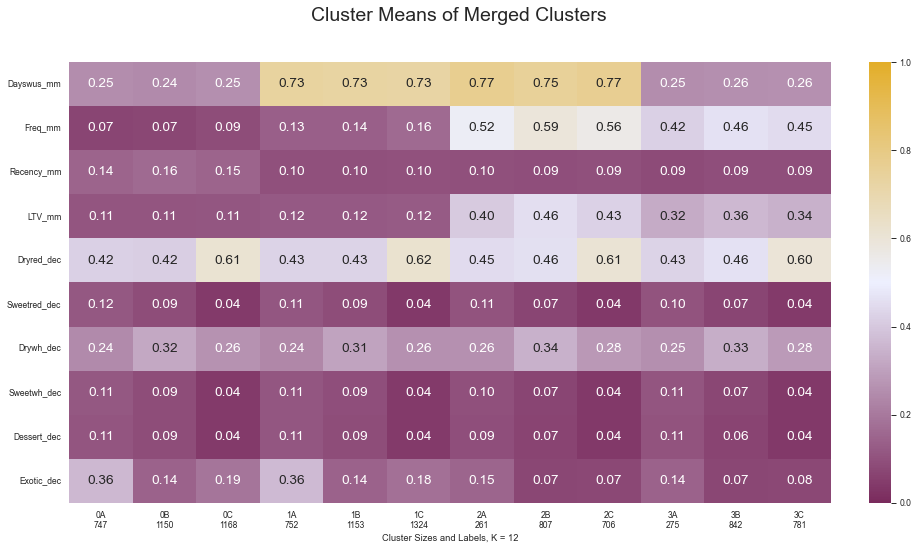

In [108]:
show_cluster_heatmap(df_, 'merged_labels', vw_feats, 'Cluster Means of Merged Clusters')


In [109]:
merged_tsne = TSNE(random_state=RANDOM_STATE).fit_transform(df_[vw_feats])

In [110]:
df_[vw_feats]

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec
Custid,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,0.67,0.04,0.26,0.02,0.01,0.01
3956,0.701429,0.660377,0.060109,0.401456,0.49,0.00,0.46,0.01,0.03,0.00
3681,0.165714,0.056604,0.102004,0.095745,0.04,0.29,0.14,0.32,0.21,0.48
2829,0.712857,0.018868,0.083789,0.096305,0.86,0.01,0.11,0.01,0.01,0.55
8788,0.410000,0.018868,0.005464,0.101904,0.85,0.00,0.12,0.02,0.01,0.28
...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,0.78,0.00,0.20,0.01,0.01,0.11
4070,0.065714,0.320755,0.081967,0.318589,0.30,0.12,0.36,0.10,0.12,0.13
7909,0.098571,0.037736,0.118397,0.102464,0.06,0.24,0.10,0.38,0.22,0.41


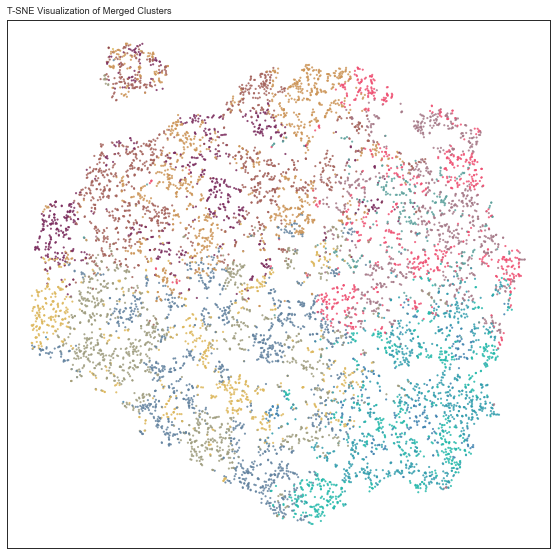

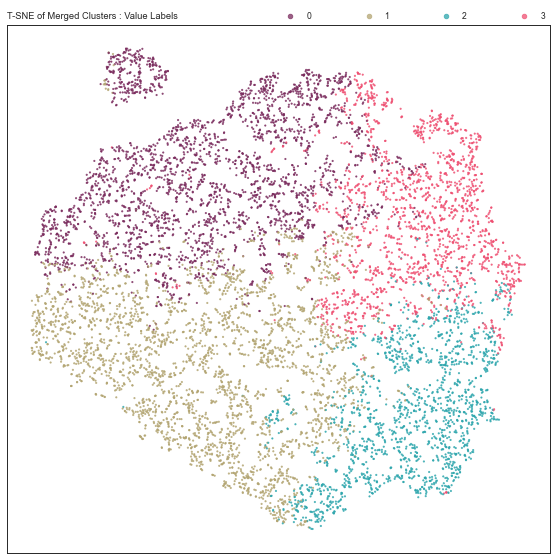

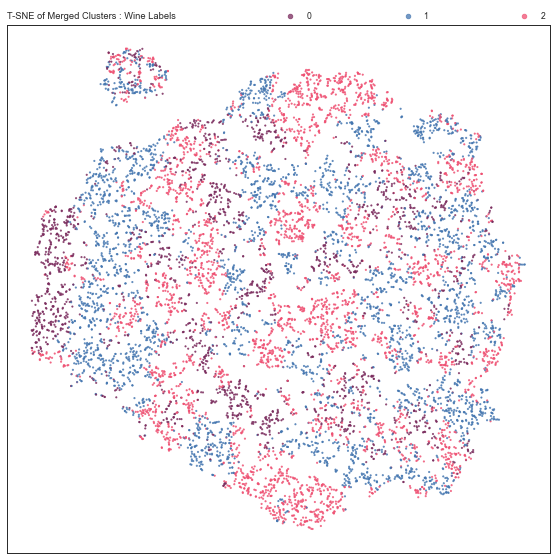

In [111]:
tsne_merged_df = pd.DataFrame(merged_tsne)

plot_clusters(tsne_merged_df, df_['merged_labels'], 'T-SNE Visualization of Merged Clusters', merged_labels_list)
plot_clusters(tsne_merged_df, df_['value_labels'], 'T-SNE of Merged Clusters : Value Labels')
plot_clusters(tsne_merged_df, df_['wine_labels'], 'T-SNE of Merged Clusters : Wine Labels')

In [112]:
merged_umap = umap.UMAP(random_state=RANDOM_STATE, metric='euclidean', min_dist=1, n_neighbors=150, n_components=2)\
                    .fit_transform(df_[vw_feats])
umap_merged_df = pd.DataFrame(merged_umap)


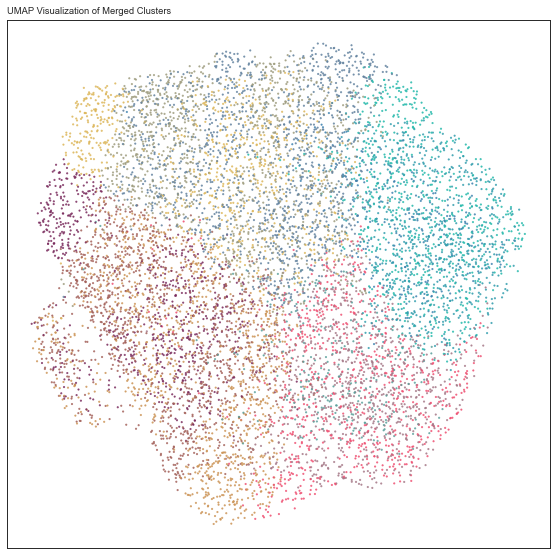

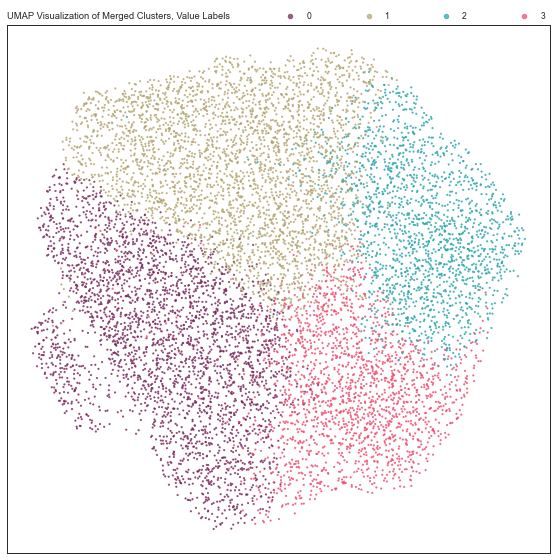

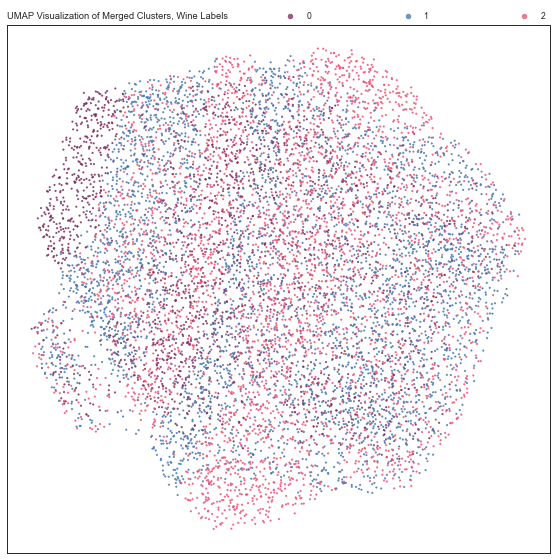

In [113]:
plot_clusters(umap_merged_df, df_['merged_labels'], 'UMAP Visualization of Merged Clusters', merged_labels_list)
plot_clusters(umap_merged_df, df_['value_labels'], 'UMAP Visualization of Merged Clusters, Value Labels')
plot_clusters(umap_merged_df, df_['wine_labels'], 'UMAP Visualization of Merged Clusters, Wine Labels')


In [114]:
#plot_clusters(umap_merged_df, df_['wine_labels'], 'UMAP of Merged Clusters: Wine Labels')
#plot_clusters(umap_merged_df, df_['value_labels'], 'UMAP of Merged Clusters: Value Labels')


In [115]:
df_

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,value_labels,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels,wine_letters,merged_labels
Custid,,,,,,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,3,0.67,0.04,0.26,0.02,0.01,0.01,0,1,B,3B
3956,0.701429,0.660377,0.060109,0.401456,2,0.49,0.00,0.46,0.01,0.03,0.00,4,2,C,2C
3681,0.165714,0.056604,0.102004,0.095745,0,0.04,0.29,0.14,0.32,0.21,0.48,6,0,A,0A
2829,0.712857,0.018868,0.083789,0.096305,1,0.86,0.01,0.11,0.01,0.01,0.55,7,0,A,1A
8788,0.410000,0.018868,0.005464,0.101904,0,0.85,0.00,0.12,0.02,0.01,0.28,5,2,C,0C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,1,0.78,0.00,0.20,0.01,0.01,0.11,5,2,C,1C
4070,0.065714,0.320755,0.081967,0.318589,3,0.30,0.12,0.36,0.10,0.12,0.13,2,1,B,3B
7909,0.098571,0.037736,0.118397,0.102464,0,0.06,0.24,0.10,0.38,0.22,0.41,6,0,A,0A


## Merge Wine and RFM

In [116]:
#df_wine_rfm = df_wine_kmeans.copy()
df_wine_rfm = pd.concat([df_wine_kmeans,rfm_df],axis=1)
df_wine_rfm['wine_labels'].unique().tolist()

[1, 2, 0]

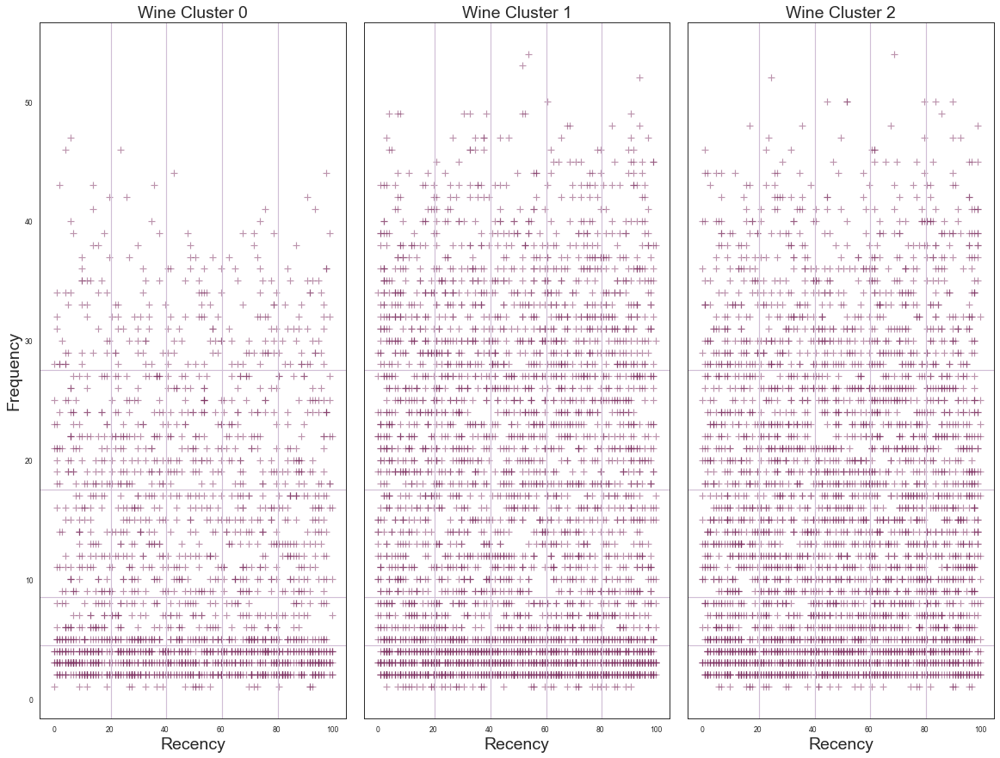

In [117]:
wine_labels_list = sorted(df_wine_rfm['wine_labels'].unique().tolist())

fig, axes = plt.subplots(1,len(wine_labels_list), figsize=(17,13), sharey=True)

wine_markers = ['.','+','x']
for l, ax in zip(wine_labels_list, axes.flatten()):
    for q in range(len(quantile_values)):
        ax.axvline(quantile_values[q]+.49, 
               label=str(int(quantile_values[q]))+'th Percentile', 
               color=COLORS[3])
    
        ax.axhline(freq_quints[q]+.5, 
               label=str(int(quantile_values[q]))+'th Percentile', 
               color=COLORS[3])

    ax.scatter(data=df_wine_rfm.loc[df_wine_rfm['wine_labels']==l,:], x='Recency', y='Freq', #hue='wine_labels', 
               alpha=.5, s=80, marker=wine_markers[1], cmap=CAT_CMAP,
                         )

    if l== 0:
        ax.set_ylabel('Frequency', fontsize=20)
    ax.set_xlabel('Recency', fontsize=20)

    ax.set_title('Wine Cluster '+str(l), fontsize=20)
    #ax.legend([])
    #rfm_title='Recency vs Frequency Quintiles'

    #plt.suptitle(rfm_title, fontsize=20, y=.91)
    #plt.margins(0.025, 0.05)
    #if SAVE_PLOTS:
    #    save_fig(rfm_title, fig)
plt.tight_layout()
plt.show()

## Merging Value and RFM


In [118]:
df_value_rfm = pd.concat([df_value_kmeans,rfm_df],axis=1)
sorted(df_value_rfm['value_labels'].unique().tolist())

[0, 1, 2, 3]

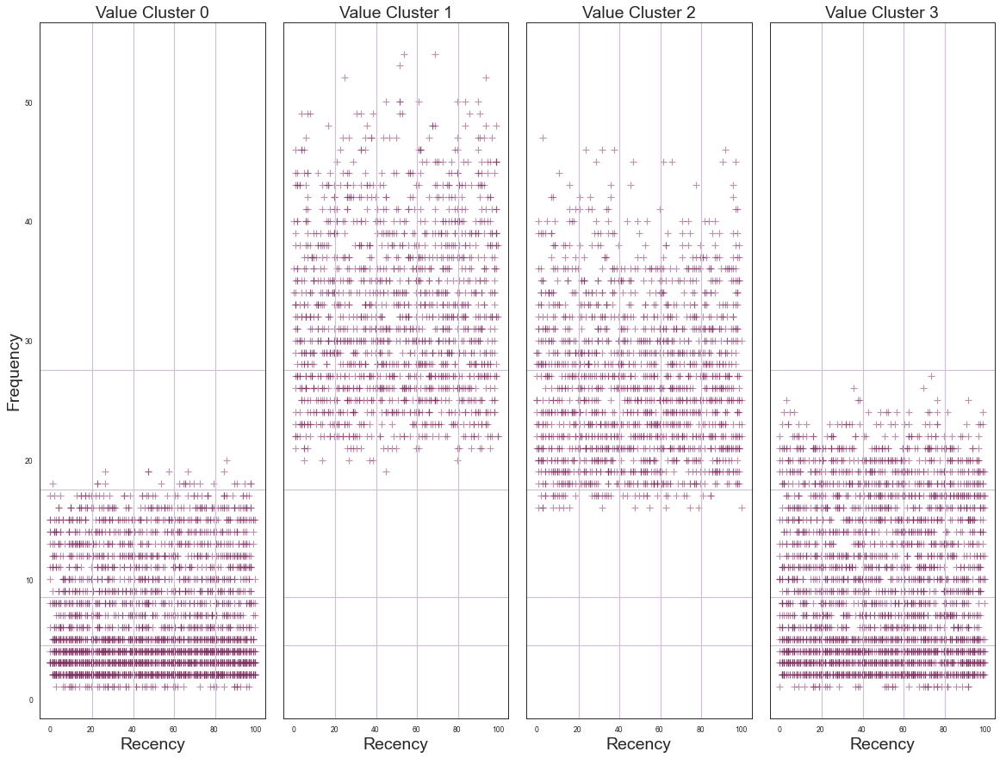

In [119]:
val_labels_list = sorted(df_value_rfm['value_labels'].unique().tolist())

fig, axes = plt.subplots(1,len(val_labels_list), figsize=(17,13), sharey=True)

val_markers = ['.','+','x']
for l, ax in zip(val_labels_list, axes.flatten()):
    for q in range(len(quantile_values)):
        ax.axvline(quantile_values[q]+.49, 
               label=str(int(quantile_values[q]))+'th Percentile', 
               color=COLORS[3])
    
        ax.axhline(freq_quints[q]+.5, 
               label=str(int(quantile_values[q]))+'th Percentile', 
               color=COLORS[3])

    ax.scatter(data=df_value_rfm.loc[df_value_rfm['value_labels']==l,:], x='Recency', y='Freq', #hue='wine_labels', 
               alpha=.5, s=80, marker=val_markers[1], cmap=CAT_CMAP,
                         )

    if l== 0:
        ax.set_ylabel('Frequency', fontsize=20)
    ax.set_xlabel('Recency', fontsize=20)

    ax.set_title('Value Cluster '+str(l), fontsize=20)
    #ax.legend([])
    #rfm_title='Recency vs Frequency Quintiles'

    #plt.suptitle(rfm_title, fontsize=20, y=.91)
    #plt.margins(0.025, 0.05)
    #if SAVE_PLOTS:
    #    save_fig(rfm_title, fig)
plt.tight_layout()
plt.show()

# Characterizing final clusters

In [120]:
## Function to plot histograms of numeric features for specified dataframe
def plot_final_histo_box(df, features, col, title = "Final Clusters: Relative Distributions of Numeric Variables"):
    if show_plots:
        
        rows = sorted(df[col].unique().tolist())
        
        merged_labels_map = {}
        for i in range(len(rows)):
            merged_labels_map[rows[i]] = i
    
        cols = range(len(features))

        fig = plt.figure(figsize=(22,32), \
                         constrained_layout=True)
        
        
        
        subfigs = fig.subfigures(len(rows), len(features), facecolor='#fdfdfd')
        for c in cols: # feats
            for r in rows: # clusters
                ri = merged_labels_map[r]
                color = cm.viridis(ri / len(rows))
                
                df_ = df.loc[df[col]==r,[features[c]]]
                axs = subfigs[ri][c].subplots(2, 1, sharex='col', \
                                gridspec_kw={'height_ratios': [4,1]})
                axs[0].hist(df_, color=color)
                axs[0].set_xlim(0,1)
                axs[0].set_title(features[c], y=1, fontsize=20)
                
                sns.boxplot(x=df_[features[c]], ax=axs[1], color=color)
                axs[1].set_xlabel(None)
                
                if c==0:
                    csize = ' [ ' + str(len(df_)) + ' ]'
                    axs[0].set_ylabel('Cluster '+ str(r)+csize)
        
        plt.suptitle(title, fontsize=24)
        if SAVE_PLOTS:
            save_fig(title, fig)
        
        plt.show()
    else:
        print("show_plots is currently set to False")
        


In [121]:
df_



,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,value_labels,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels,wine_letters,merged_labels
Custid,,,,,,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,3,0.67,0.04,0.26,0.02,0.01,0.01,0,1,B,3B
3956,0.701429,0.660377,0.060109,0.401456,2,0.49,0.00,0.46,0.01,0.03,0.00,4,2,C,2C
3681,0.165714,0.056604,0.102004,0.095745,0,0.04,0.29,0.14,0.32,0.21,0.48,6,0,A,0A
2829,0.712857,0.018868,0.083789,0.096305,1,0.86,0.01,0.11,0.01,0.01,0.55,7,0,A,1A
8788,0.410000,0.018868,0.005464,0.101904,0,0.85,0.00,0.12,0.02,0.01,0.28,5,2,C,0C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,1,0.78,0.00,0.20,0.01,0.01,0.11,5,2,C,1C
4070,0.065714,0.320755,0.081967,0.318589,3,0.30,0.12,0.36,0.10,0.12,0.13,2,1,B,3B
7909,0.098571,0.037736,0.118397,0.102464,0,0.06,0.24,0.10,0.38,0.22,0.41,6,0,A,0A


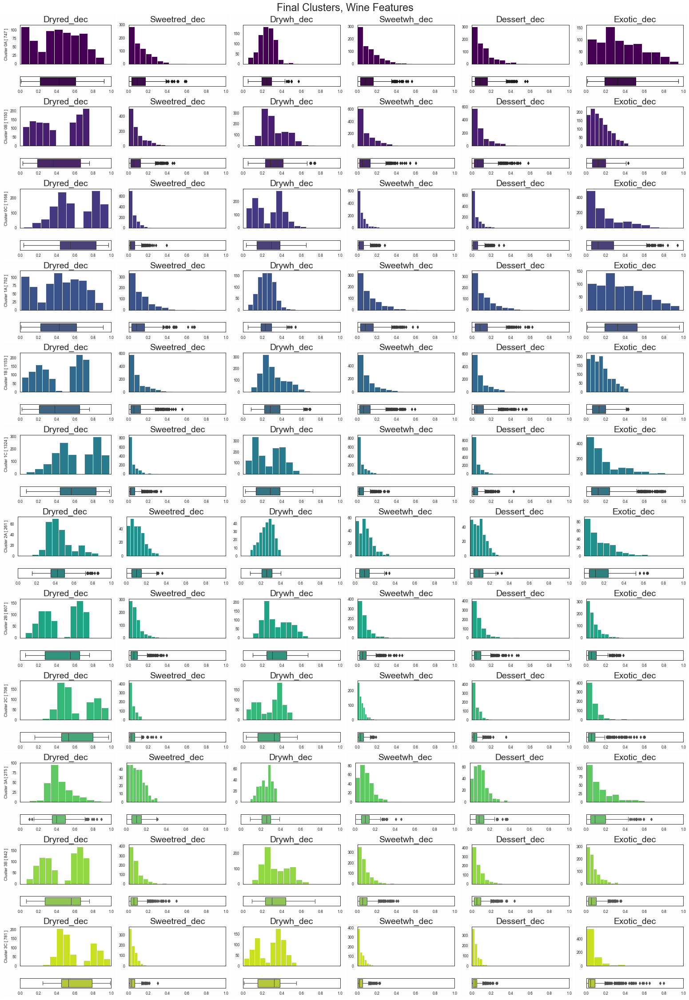

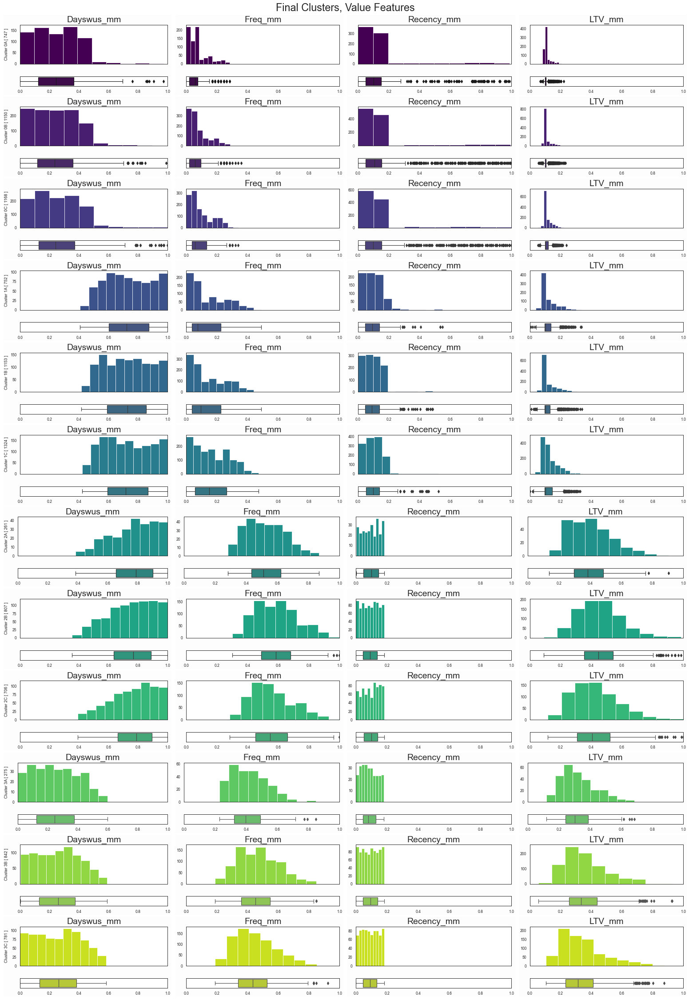

In [122]:
plot_final_histo_box(df_, wine_feats_dec, 'merged_labels', title='Final Clusters, Wine Features')
plot_final_histo_box(df_, value_feats_mm, 'merged_labels', title='Final Clusters, Value Features')

In [123]:
df_['merged_labels']

Custid
5325    3B
3956    2C
3681    0A
2829    1A
8788    0C
        ..
1383    1C
4070    3B
7909    0A
4158    0B
4914    2B
Name: merged_labels, Length: 9966, dtype: object

In [124]:
#plot_final_histo_box(df, other_features, 'merged_labels', title='Final Clusters, Other Features')

In [125]:
#plot_final_histo_box(df_, wine_feats_dec, 'wine_labels', title='Wine Segmentation, Wine Features')
#plot_final_histo_box(df_, value_feats_mm, 'value_labels', title='Value Segmentation, Value Features')

In [126]:
df_allfeats = pd.merge(df_original, df_, how='right',left_index=True, right_index=True, suffixes=('', '_drop')) #.drop_duplicates()


In [127]:
def hist_cluster_vs_all(df, k, col, feats, title='Mean Values, Clusters vs Population'):

    clustermeans_ = df.groupby(col).mean()[feats].reset_index()

    fig, axes = plt.subplots(2,int(len(feats)/2), figsize=(15,7), constrained_layout=True)
    i = 0
    
    colors = [ (cm.viridis(float(i) / len(clustermeans_['merged_labels']))) for i in range(len(clustermeans_['merged_labels'])) ]
    
    for m, ax in zip(feats, axes.flatten()):
        
        ax.bar(height=clustermeans_.loc[:,m], x=clustermeans_['merged_labels'].astype(str), color=colors)
        m_ = df[feats].mean()[m]
        ax.axhline(m_, label='Pop. mean', color='r',linestyle='dashed')
        ax.set_xlabel('Cluster Labels')
        if (m == wine_feats_dec[-1])|(m == value_feats_mm[-1])|(m == other_features[-1]):
            ax.legend(bbox_to_anchor=(1,1.02), loc="upper right", frameon=False)
        ax.set_title(m)

    fig.suptitle(title, fontsize=20)

    save_fig(title, fig)

    plt.show()




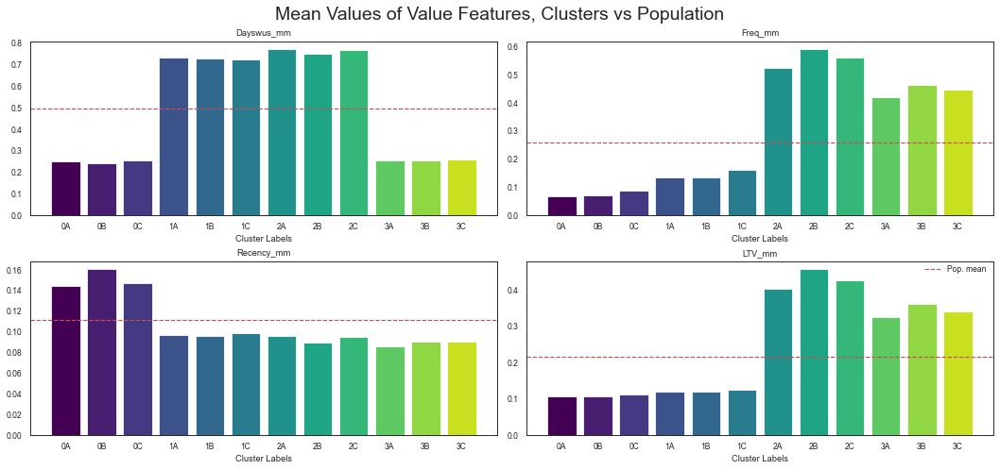

In [128]:
hist_cluster_vs_all(df_allfeats,5,'merged_labels', value_feats_mm, title='Mean Values of Value Features, Clusters vs Population')


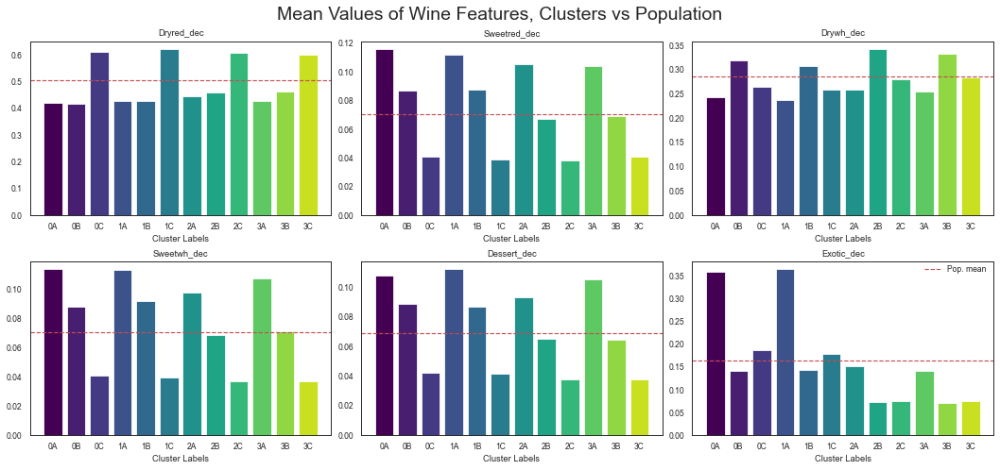

In [129]:
hist_cluster_vs_all(df_allfeats,5,'merged_labels', wine_feats_dec, title='Mean Values of Wine Features, Clusters vs Population')


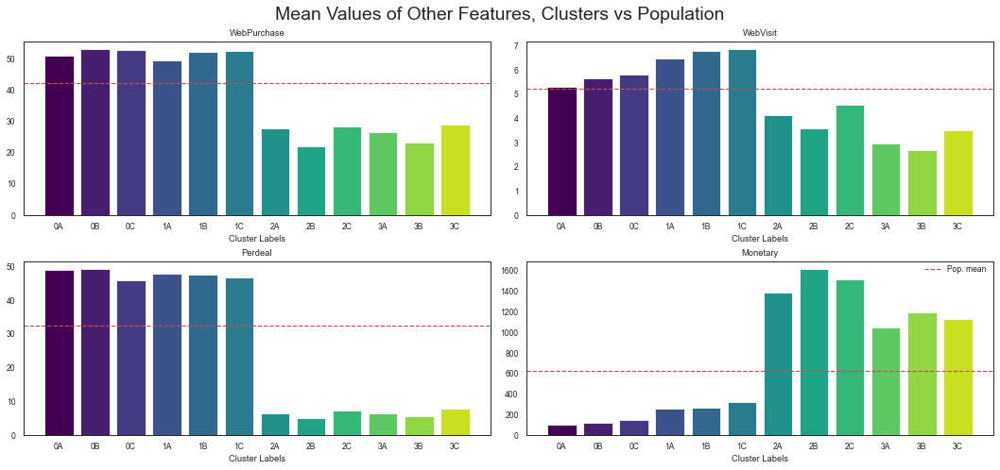

In [130]:
hist_cluster_vs_all(df_allfeats,5,'merged_labels', other_features, title='Mean Values of Other Features, Clusters vs Population')


# Exploring the clusters

In [131]:
df_[value_feats_mm]
df_[wine_feats_dec]

,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec
Custid,,,,,,
5325,0.67,0.04,0.26,0.02,0.01,0.01
3956,0.49,0.00,0.46,0.01,0.03,0.00
3681,0.04,0.29,0.14,0.32,0.21,0.48
2829,0.86,0.01,0.11,0.01,0.01,0.55
8788,0.85,0.00,0.12,0.02,0.01,0.28
...,...,...,...,...,...,...
1383,0.78,0.00,0.20,0.01,0.01,0.11
4070,0.30,0.12,0.36,0.10,0.12,0.13
7909,0.06,0.24,0.10,0.38,0.22,0.41


In [132]:
def show_value_wine_scatter(df, row_feats, col_feats, title='Scatter Plot of Features'):
    fig, axes = plt.subplots(len(row_feats), len(col_feats), 
                         figsize=(15,11), sharex=True)

    for row in range(len(row_feats)):
        for col in range(len(col_feats)):
            x=df[row_feats[row]]
            y=df[col_feats[col]]
            axes[row][col].scatter(x,y, alpha=.25, s=1)

            if col == 0:
                axes[row][col].set_ylabel(row_feats[row])

            if row == 0:
                axes[row][col].set_title(col_feats[col], y=1)

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

In [133]:
df_

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,value_labels,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels,wine_letters,merged_labels
Custid,,,,,,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,3,0.67,0.04,0.26,0.02,0.01,0.01,0,1,B,3B
3956,0.701429,0.660377,0.060109,0.401456,2,0.49,0.00,0.46,0.01,0.03,0.00,4,2,C,2C
3681,0.165714,0.056604,0.102004,0.095745,0,0.04,0.29,0.14,0.32,0.21,0.48,6,0,A,0A
2829,0.712857,0.018868,0.083789,0.096305,1,0.86,0.01,0.11,0.01,0.01,0.55,7,0,A,1A
8788,0.410000,0.018868,0.005464,0.101904,0,0.85,0.00,0.12,0.02,0.01,0.28,5,2,C,0C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,1,0.78,0.00,0.20,0.01,0.01,0.11,5,2,C,1C
4070,0.065714,0.320755,0.081967,0.318589,3,0.30,0.12,0.36,0.10,0.12,0.13,2,1,B,3B
7909,0.098571,0.037736,0.118397,0.102464,0,0.06,0.24,0.10,0.38,0.22,0.41,6,0,A,0A


In [134]:
df_allfeats.loc[df_allfeats['Recency']<=100,:]

,Dayswus,Age,Edu,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,...,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels,wine_letters,merged_labels
Custid,,,,,,,,,,,,,,,,,,,,,
5325,653.0,55.0,20.0,78473.0,20.0,18.0,826.0,445.0,7.0,67.0,...,0.67,0.04,0.26,0.02,0.01,0.01,0,1,B,3B
3956,1041.0,75.0,18.0,105087.0,36.0,33.0,1852.0,539.0,2.0,49.0,...,0.49,0.00,0.46,0.01,0.03,0.00,4,2,C,2C
3681,666.0,18.0,12.0,27984.0,4.0,56.0,39.0,-7.0,88.0,4.0,...,0.04,0.29,0.14,0.32,0.21,0.48,6,0,A,0A
2829,1049.0,42.0,16.0,61748.0,2.0,46.0,37.0,-6.0,70.0,86.0,...,0.86,0.01,0.11,0.01,0.01,0.55,7,0,A,1A
8788,837.0,47.0,16.0,65789.0,2.0,3.0,36.0,4.0,35.0,85.0,...,0.85,0.00,0.12,0.02,0.01,0.28,5,2,C,0C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7989,774.0,43.0,18.0,42853.0,4.0,33.0,59.0,-17.0,90.0,73.0,...,0.73,0.01,0.25,0.01,0.00,0.07,0,1,B,0B
1383,1132.0,57.0,20.0,81033.0,19.0,59.0,776.0,187.0,22.0,78.0,...,0.78,0.00,0.20,0.01,0.01,0.11,5,2,C,1C
4070,596.0,66.0,15.0,84714.0,18.0,45.0,720.0,391.0,5.0,30.0,...,0.30,0.12,0.36,0.10,0.12,0.13,2,1,B,3B


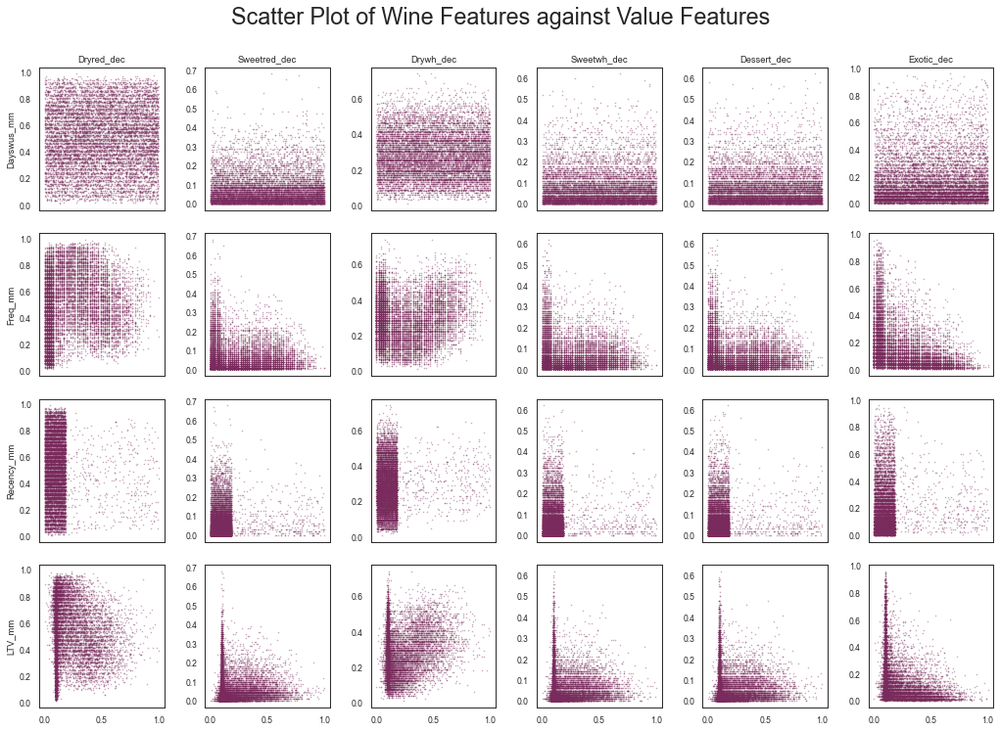

In [135]:
show_value_wine_scatter(df_, value_feats_mm, wine_feats_dec, title='Scatter Plot of Wine Features against Value Features')

In [136]:
#clusterlabels = sorted(df_['wine_labels'].unique().tolist())

#for c in clusterlabels:
#    plottitle ='Scatter Plot of Wine Features against Value Features: Cluster '+ str(c)
#    show_value_wine_scatter(df_.loc[df_['wine_labels']==c,:], value_feats_mm, wine_feats_dec, plottitle)    

In [137]:
df_original
df_

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,value_labels,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels,wine_letters,merged_labels
Custid,,,,,,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,3,0.67,0.04,0.26,0.02,0.01,0.01,0,1,B,3B
3956,0.701429,0.660377,0.060109,0.401456,2,0.49,0.00,0.46,0.01,0.03,0.00,4,2,C,2C
3681,0.165714,0.056604,0.102004,0.095745,0,0.04,0.29,0.14,0.32,0.21,0.48,6,0,A,0A
2829,0.712857,0.018868,0.083789,0.096305,1,0.86,0.01,0.11,0.01,0.01,0.55,7,0,A,1A
8788,0.410000,0.018868,0.005464,0.101904,0,0.85,0.00,0.12,0.02,0.01,0.28,5,2,C,0C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,1,0.78,0.00,0.20,0.01,0.01,0.11,5,2,C,1C
4070,0.065714,0.320755,0.081967,0.318589,3,0.30,0.12,0.36,0.10,0.12,0.13,2,1,B,3B
7909,0.098571,0.037736,0.118397,0.102464,0,0.06,0.24,0.10,0.38,0.22,0.41,6,0,A,0A


In [138]:
df_full = pd.merge(df_original, df_, how='left',left_index=True, right_index=True, suffixes=('', '_drop')) #.drop_duplicates()
df_full.drop([col for col in df_full.columns if 'drop' in col], axis=1, inplace=True)


In [139]:
wine_cluster_means2 = df_full.groupby(['merged_labels']).mean()[wine_features]
wine_cluster_means2
#if SAVE_PLOTS:
    #wine_cluster_means2.to_csv('../../out/wine_final_cluster_means_percent.csv')

,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic
merged_labels,,,,,,
0A,41.935743,11.572959,24.327979,11.333333,10.807229,35.991968
0B,41.754783,8.724348,31.813043,8.801739,8.893043,14.144348
0C,61.137842,4.112158,26.409247,4.085616,4.217466,18.775685
1A,42.646277,11.206117,23.698138,11.263298,11.202128,36.466755
1B,42.651344,8.758023,30.766696,9.167389,8.676496,14.271466
1C,62.074773,3.879909,25.941843,3.920695,4.120846,17.958459
2A,44.632184,10.505747,25.781609,9.735632,9.318008,15.206897
2B,45.763321,6.736059,34.158612,6.809170,6.526642,7.214374
2C,60.696884,3.839943,28.011331,3.677054,3.753541,7.494334


In [140]:
value_cluster_means = df_full.groupby(['merged_labels']).mean()[value_features]


value_cluster_means_mm = df_full.groupby(['merged_labels']).mean()[value_feats_mm]

if SAVE_PLOTS:
    value_cluster_means.to_csv('../../out/value_final_cluster_means.csv')
    value_cluster_means_mm.to_csv('../../out/value_final_cluster_means_scaled.csv')


In [141]:
other_cluster_means = df_full.groupby(['merged_labels']).mean()[demog_features+other_features]

if SAVE_PLOTS:
    other_cluster_means.to_csv('../../out/othervars_final_cluster_means.csv')

In [142]:
wine_means = df_full.groupby(['wine_labels']).mean()

value_means = df_full.groupby(['value_labels']).mean()

if SAVE_PLOTS:
    wine_means.to_csv('../../out/wine_means.csv')
    value_means.to_csv('../../out/value_means.csv')


In [143]:
value_means.reset_index()

,value_labels,Dayswus,Age,Edu,Income,Freq,Recency,Monetary,LTV,Perdeal,...,Recency_mm,LTV_mm,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels
0,0.0,724.407830,37.584339,16.619250,53128.786623,5.041436,83.251223,125.668842,16.701142,47.786297,...,0.151642,0.109015,0.491853,0.076610,0.279295,0.076215,0.075778,0.212339,3.629364,1.137357
1,1.0,1060.005884,38.545060,16.592753,54515.348715,8.736451,53.413750,286.422731,40.061319,47.184887,...,0.097293,0.122095,0.506144,0.073280,0.271421,0.075042,0.073967,0.209523,3.655311,1.177145
2,2.0,1082.701804,65.222661,17.016347,98096.652198,31.142616,50.873732,1540.829200,601.095265,6.127959,...,0.092666,0.436224,0.515400,0.061381,0.304797,0.059932,0.058337,0.085017,3.268884,1.250846
3,3.0,730.306112,64.777661,16.965227,97328.646997,24.857745,49.317176,1145.213383,442.435722,6.681770,...,0.089831,0.347388,0.514705,0.062566,0.300753,0.062229,0.059278,0.083219,3.283983,1.266596


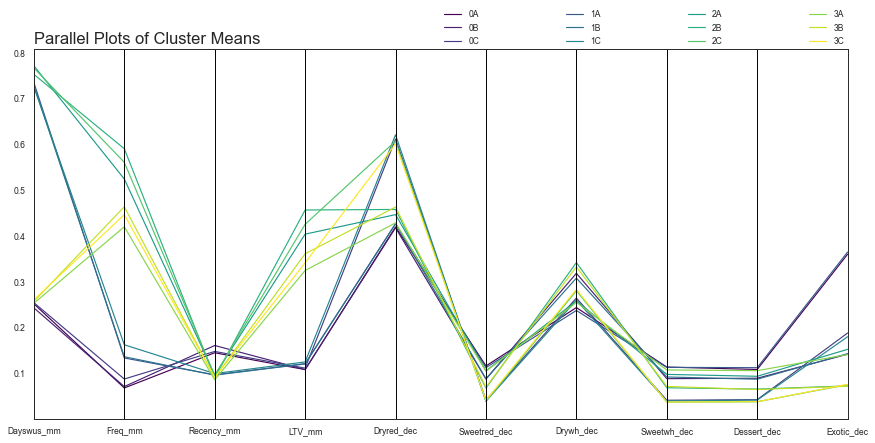

In [144]:
df_parallel = df_full.groupby(['merged_labels']).mean()

fig, ax = plt.subplots(figsize=(15,7))
pd.plotting.parallel_coordinates(
    df_parallel[value_feats_mm+wine_feats_dec].reset_index(), 'merged_labels', 
    colormap='viridis', ax=ax
)

ax.legend(bbox_to_anchor=(.5,1,.5,1), loc="lower left", frameon=False,
          mode='expand', borderaxespad=0, ncol=4,
          )
ax.yaxis.grid(which="major", linewidth=0)

plt.title('Parallel Plots of Cluster Means', loc='left', fontsize=17)

if SAVE_PLOTS:
    save_fig('Parallel Plots of Cluster Means', fig)
plt.show()

# Classify and predict noise and outlier rows

In [145]:
Xv = df_full.loc[~df_full['merged_labels'].isna(),value_features]
yv = df_full.loc[~df_full['merged_labels'].isna(),'value_labels']


In [146]:
X_train, X_test, y_train, y_test = train_test_split(
    Xv, yv, test_size=0.2, random_state=RANDOM_STATE
)

# Fitting the decision tree
dtv = DecisionTreeClassifier(random_state=RANDOM_STATE, max_depth=5)
dtv.fit(X_train, y_train)

print("On average, we are able to predict an estimated {0:.2f}% of the customers' Value labels correctly".format(dtv.score(X_test, y_test)*100))



On average, we are able to predict an estimated 93.88% of the customers' Value labels correctly


In [147]:
pd.DataFrame(dtv.feature_importances_, index=X_train.columns).sort_values(by=0, ascending=False)

,0
Freq,0.563614
Dayswus,0.368439
LTV,0.042326
Recency,0.025620


In [148]:
# Predicting the cluster labels of the noise and outliers

df_full.loc[df_full['merged_labels'].isna(),'value_labels'] = dtv.predict(df_full.loc[df_full['merged_labels'].isna(),value_features])



In [149]:
Xw = df_full.loc[~df_full['merged_labels'].isna(),wine_features]
yw = df_full.loc[~df_full['merged_labels'].isna(),'wine_labels']


In [150]:
Xw_train, Xw_test, yw_train, yw_test = train_test_split(
    Xw, yw, test_size=0.2, random_state=RANDOM_STATE
)

# Fitting the decision tree
dtw = DecisionTreeClassifier(random_state=RANDOM_STATE, max_depth=5)
dtw.fit(Xw_train, yw_train)

print("On average, we are able to predict an estimated {0:.2f}% of the customers' Wine labels correctly".format(dtw.score(Xw_test, yw_test)*100))



On average, we are able to predict an estimated 88.31% of the customers' Wine labels correctly


In [151]:
pd.DataFrame(dtw.feature_importances_, index=Xw_train.columns).sort_values(by=0, ascending=False)

,0
Dryred,0.639514
Exotic,0.231822
Drywh,0.128664
Sweetred,0.000000
Sweetwh,0.000000
Dessert,0.000000


In [152]:
df_full.loc[df_full['merged_labels'].isna(),'wine_labels'] = dtw.predict(df_full.loc[df_full['merged_labels'].isna(),wine_features])


In [153]:
val_labels_list

[0, 1, 2, 3]

# Visualize Decision Tree

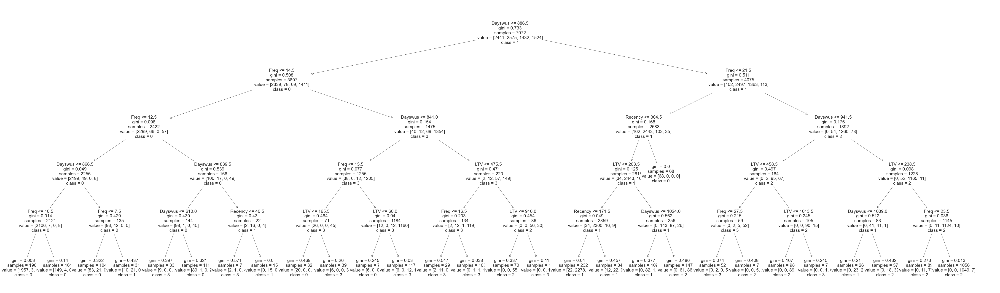

In [154]:
fig, axes = plt.subplots(1,1,figsize = (80,24))

tree.plot_tree(dtv,
               feature_names = Xv.columns.to_list(), 
               class_names=['0','1','2','3'],
               filled = False,
               fontsize=20, ax=axes);
plt.show()

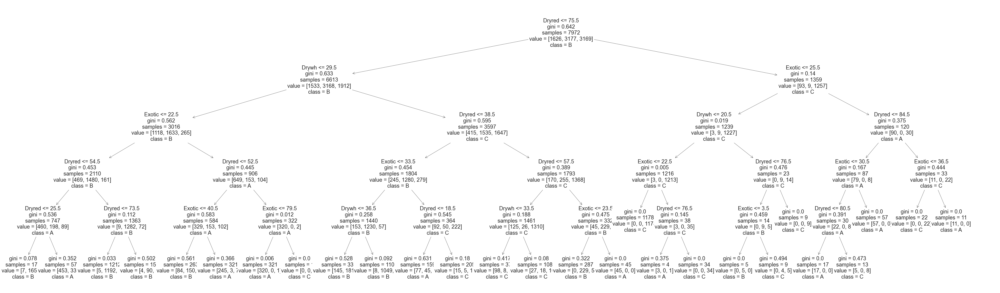

In [155]:
fig, axes = plt.subplots(1,1,figsize = (80,24))

tree.plot_tree(dtw,
               feature_names = Xw.columns.to_list(), 
               class_names=['A','B','C'],
               filled = False,
               fontsize=24, ax=axes);
plt.show()

# Supporting Visualizations

In [156]:
## Code based from sklearn documentation:
## https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html?highlight=silhouette

def plotSilhouettes(X, max_clust, plot_dim, title = "Silhouette analysis for KMeans clustering with different K sizes"):
    range_n_clusters = range(2, max_clust+1)

    fig, axes = plt.subplots(plot_dim[0], plot_dim[1], sharex=True, figsize=(19,11))
    #fig.set_size_inches(11, 11)

    for ax, nclust in zip(axes.flatten(), range_n_clusters):
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax.set_ylim([0, len(X) + (nclust + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=nclust, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        silhouette_avg = silhouette_score(X, cluster_labels)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(nclust):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.viridis(float(i) / nclust)
            #color = COLORS[i]
            ax.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i), fontsize=14)

        # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples


        ax.set_title("K = "+ str(nclust))
        ax.set_ylabel("Cluster label")

        ax.set_yticks([])  # Clear the yaxis labels / ticks
        ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        
        # The vertical line for average silhouette score of all the values
        ax.axvline(x=silhouette_avg, color="red", linestyle="--", label='Average\nSilhouette\nScore')
        if nclust == 2 :
            ax.legend(frameon=False)
        
        plt.suptitle(
            title,
            fontsize=18,
            y=.95
        )
    save_fig(title, fig)
    plt.show()

## Ideal cluster sizes: silhouette plots

### Wine Segmentation

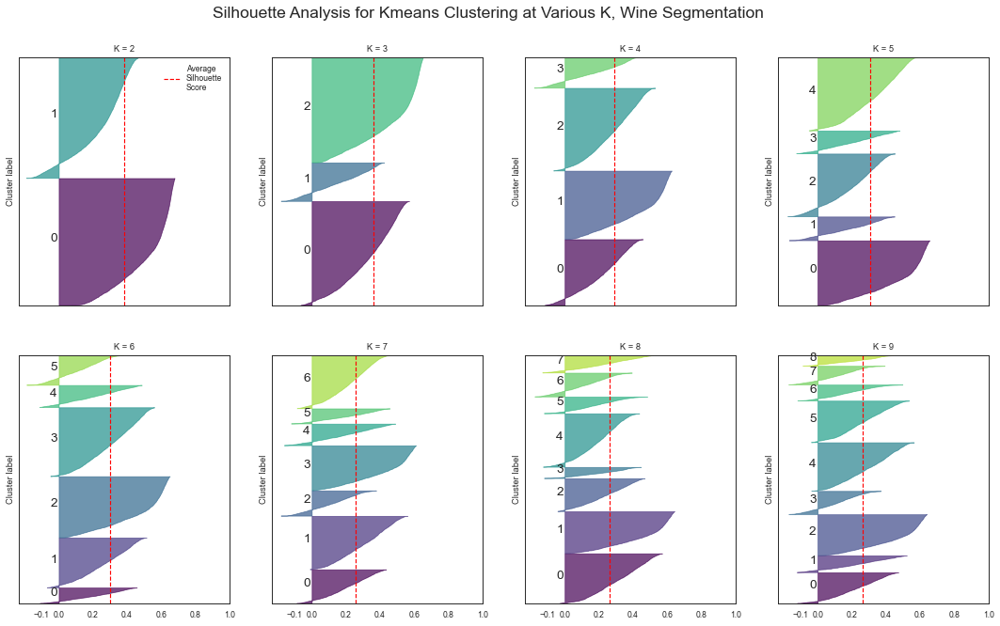

In [157]:
plotSilhouettes(df_wine_kmeans[wine_feats_dec], 9, [2,4], title='Silhouette Analysis for Kmeans Clustering at Various K, Wine Segmentation')

### Value Segmentation

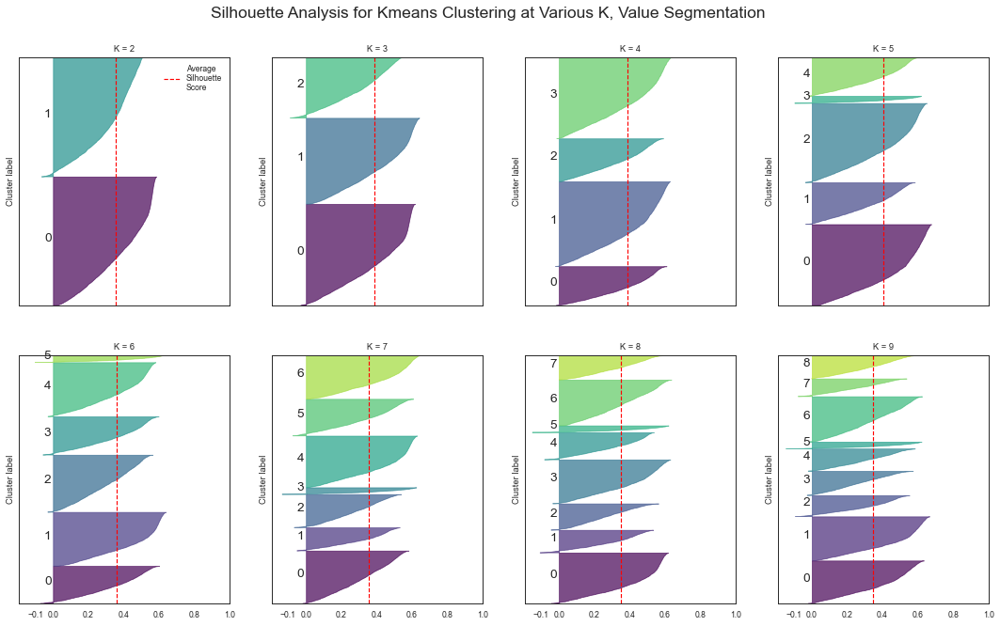

In [158]:
plotSilhouettes(df_value_kmeans[value_feats_mm], 9, [2,4], title='Silhouette Analysis for Kmeans Clustering at Various K, Value Segmentation')

In [159]:
df_

,Dayswus_mm,Freq_mm,Recency_mm,LTV_mm,value_labels,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,labels,wine_labels,wine_letters,merged_labels
Custid,,,,,,,,,,,,,,,
5325,0.147143,0.358491,0.032787,0.348824,3,0.67,0.04,0.26,0.02,0.01,0.01,0,1,B,3B
3956,0.701429,0.660377,0.060109,0.401456,2,0.49,0.00,0.46,0.01,0.03,0.00,4,2,C,2C
3681,0.165714,0.056604,0.102004,0.095745,0,0.04,0.29,0.14,0.32,0.21,0.48,6,0,A,0A
2829,0.712857,0.018868,0.083789,0.096305,1,0.86,0.01,0.11,0.01,0.01,0.55,7,0,A,1A
8788,0.410000,0.018868,0.005464,0.101904,0,0.85,0.00,0.12,0.02,0.01,0.28,5,2,C,0C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,0.831429,0.339623,0.107468,0.204367,1,0.78,0.00,0.20,0.01,0.01,0.11,5,2,C,1C
4070,0.065714,0.320755,0.081967,0.318589,3,0.30,0.12,0.36,0.10,0.12,0.13,2,1,B,3B
7909,0.098571,0.037736,0.118397,0.102464,0,0.06,0.24,0.10,0.38,0.22,0.41,6,0,A,0A


# Other things we tried

## Self Organizing Maps

### Value

In [160]:
som_vars = value_feats_mm
df_som = df_nonoise.copy()

## From Lab 11

np.random.seed(RANDOM_STATE)

smv = sompy.SOMFactory().build(
    df_som[som_vars].values, 
    mapsize=[15,15],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=som_vars
)
smv.train(n_job=4, train_rough_len=50, train_finetune_len=50)



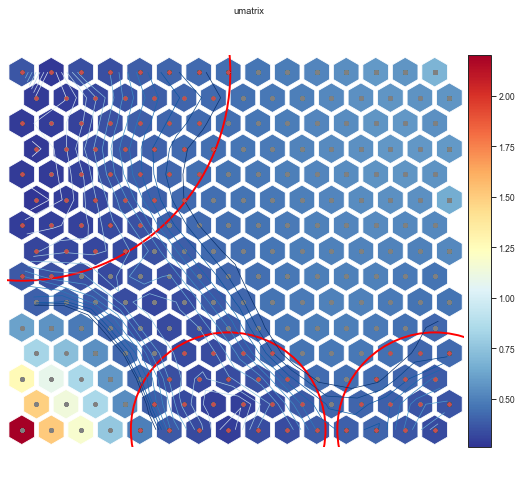

In [161]:
u = sompy.umatrix.UMatrixView(8, 8, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    smv, 
    distance=4,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)


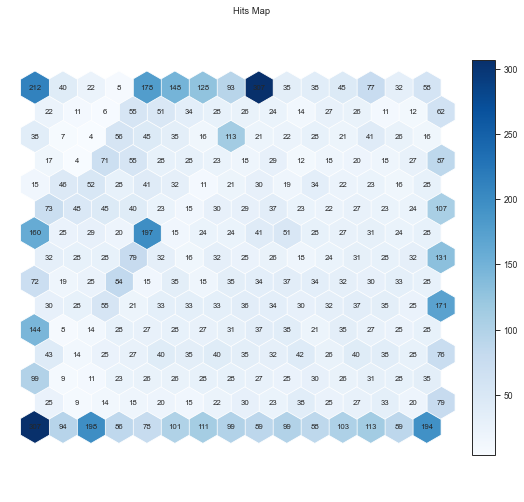

In [162]:
vhts  = BmuHitsView(9,9,"Hits Map")
vhts.show(smv, anotate=True, onlyzeros=False, labelsize=8, cmap="Blues")
plt.show()

In [163]:
def cluster_on_som(sm, k, df_, som_vars):
    df = df_.copy()
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=20, random_state=random_state)
    nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
    sm.cluster_labels = nodeclus_labels  

    # Check the nodes and and respective clusters
    nodes = sm.codebook.matrix

    somlabelk = 'som_label_'+str(k)

    df_nodes = pd.DataFrame(nodes, columns=som_vars)
    df_nodes[somlabelk] = nodeclus_labels

    # Obtaining SOM's BMUs labels
    bmus_map = sm.find_bmu(df[som_vars])[0]  # get bmus for each observation in df
    bmuk = 'BMU'+str(k)
    df[bmuk] = bmus_map
    df_bmus = df.copy()

    # Get cluster labels for each observation
    df = df_bmus.merge(df_nodes[somlabelk], 'left', left_on=bmuk, right_index=True)

    s_ = df.groupby([somlabelk]).count().iloc[:,0].tolist()
    r_ = r2_(df[som_vars + [somlabelk]],somlabelk)
    
    return ({'k':k,'r':r_,'sizes':s_}, df[somlabelk])


In [164]:
kval = 10
som_k_sizes_v = pd.DataFrame(columns=['k','r','sizes'])

for k in range(2,kval+2):
    cluster_on_som_res_d = cluster_on_som(smv,k, df_som, som_vars)
    som_k_sizes_v = som_k_sizes_v.append(cluster_on_som_res_d[0],ignore_index=True)
    
som_k_sizes_v

,k,r,sizes
0,2,0.708591,"[4863, 5103]"
1,3,0.883568,"[6684, 274, 3008]"
2,4,0.883568,"[3008, 274, 6684]"
3,5,0.876198,"[1939, 1390, 6637]"
4,6,0.801357,"[9691, 1, 274]"
5,7,0.198242,"[4, 274, 9662, 26]"
6,8,0.872431,"[9444, 274, 248]"
7,9,0.801305,"[274, 9691, 1]"
8,10,0.975582,"[7417, 2275, 274]"
9,11,0.987858,"[1748, 2992, 5226]"


In [165]:
som_k_sizes_v.sort_values(by=['r'], ascending=False)

,k,r,sizes
9,11,0.987858,"[1748, 2992, 5226]"
8,10,0.975582,"[7417, 2275, 274]"
1,3,0.883568,"[6684, 274, 3008]"
2,4,0.883568,"[3008, 274, 6684]"
3,5,0.876198,"[1939, 1390, 6637]"
6,8,0.872431,"[9444, 274, 248]"
4,6,0.801357,"[9691, 1, 274]"
7,9,0.801305,"[274, 9691, 1]"
0,2,0.708591,"[4863, 5103]"
5,7,0.198242,"[4, 274, 9662, 26]"


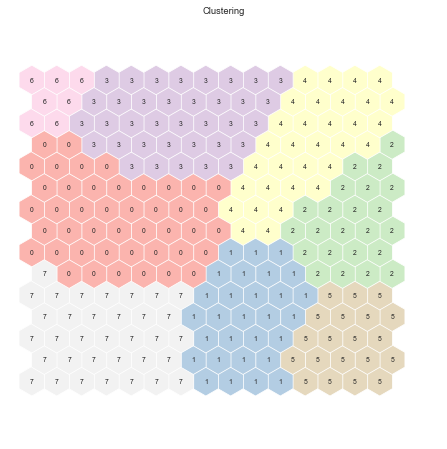

In [166]:
k = 8
cluster_on_som_res = cluster_on_som(smv,k, df_som, som_vars)
df_som['som_value']  = cluster_on_som_res[1]

# Perform K-Means clustering with selected K
kmeans = KMeans(n_clusters=k, init='k-means++', n_init=20, random_state=random_state)
nodeclus_labels = kmeans.fit_predict(smv.codebook.matrix)
smv.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(8, 8,"Clustering", text_size=10)
hits.show(smv, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

#### Visualize

In [167]:
tsnemodel_somv = TSNE(random_state=RANDOM_STATE).fit_transform(df_som[value_feats_mm])

tsne_value_somv = pd.DataFrame(tsnemodel_somv)



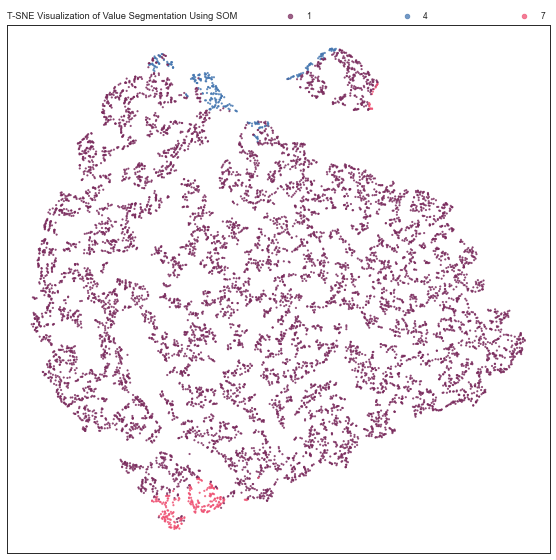

In [168]:
plot_clusters(tsne_value_somv, df_som['som_value'], 'T-SNE Visualization of Value Segmentation Using SOM')


### Wine

In [169]:
df_wine = df[wine_feats_dec].copy()

np.random.seed(RANDOM_STATE)
som_vars_w = wine_feats_dec

# Training the SOM
smw = sompy.SOMFactory().build(
    df_wine.values, 
    mapsize=[15, 15],
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=wine_feats_dec
)
smw.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

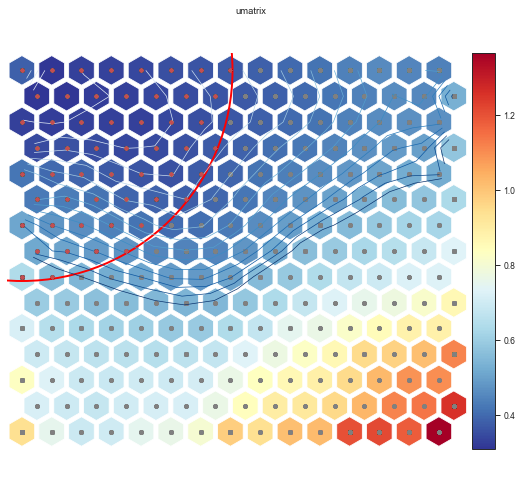

In [170]:
u = sompy.umatrix.UMatrixView(8, 8, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    smw, 
    distance=4,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)


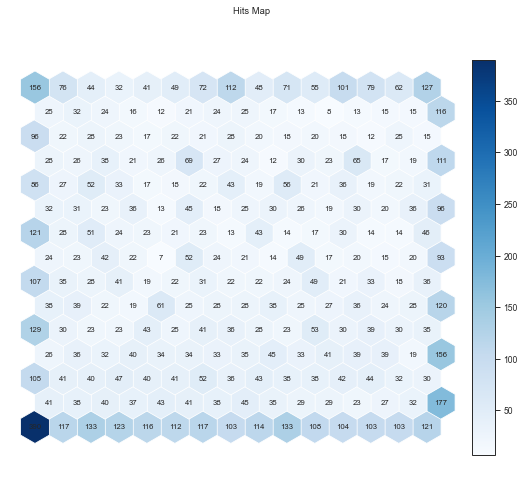

In [171]:
whts  = BmuHitsView(9,9,"Hits Map")
whts.show(smw, anotate=True, onlyzeros=False, labelsize=8, cmap="Blues")
plt.show()


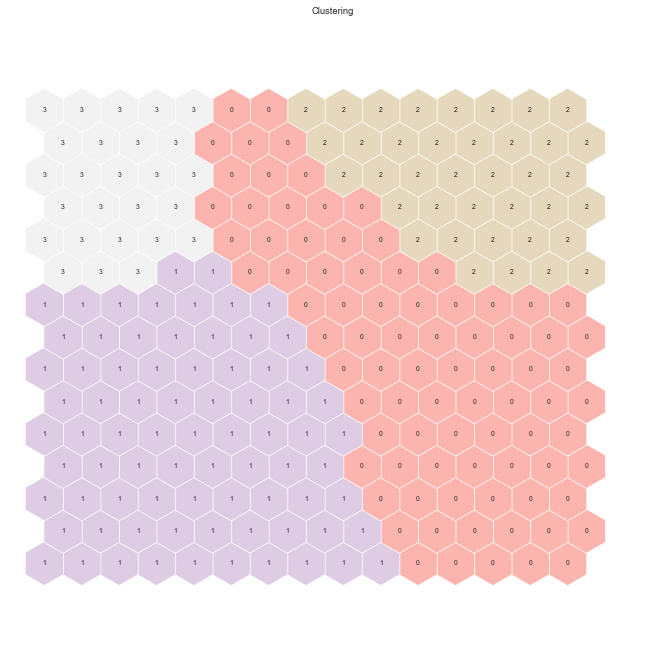

In [172]:
kmeans_somw = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=RANDOM_STATE)
nodeclus_labels = kmeans_somw.fit_predict(smw.codebook.matrix)
smw.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(smw, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [173]:
# Check the nodes and and respective clusters
wine_som_nodes = smw.codebook.matrix

df_wine_som_nodes = pd.DataFrame(wine_som_nodes, columns=wine_feats_dec)
df_wine_som_nodes['wine_nodes'] = nodeclus_labels
#df_wine_som_nodes

In [174]:
# Obtaining SOM's BMUs labels
bmus_map = smw.find_bmu(df_wine)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((df, np.expand_dims(bmus_map,1)), axis=1),
    index=df.index, columns=np.append(df.columns,"BMU")
)
#df_bmus

In [175]:
# Get cluster labels for each observation
dfw_ = df_bmus.merge(df_wine_som_nodes['wine_nodes'], 'left', left_on="BMU", right_index=True)

# Characterizing the final clusters
dfw_.drop(columns='BMU').groupby('wine_nodes').mean()

,Dayswus,Age,Edu,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,...,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec,Recency_Rank,Frequency_Rank,Monetary_Rank,RFM_Ave
wine_nodes,,,,,,,,,,,,,,,,,,,,,
0,897.411321,43.701887,15.173585,63919.154717,14.773585,69.569811,656.471698,250.381132,31.316981,14.837736,...,0.148377,0.177057,0.312528,0.186000,0.176226,0.103472,2.849057,2.656604,2.713208,2.739623
1,897.206771,50.997452,17.702949,74437.594467,14.965417,56.622861,613.264652,176.955224,30.573717,78.640335,...,0.786403,0.019385,0.155952,0.019752,0.017856,0.088970,2.941755,2.986167,3.071351,2.999757
3,898.398332,46.971527,16.429681,68479.202905,14.533218,62.915301,626.758269,220.619212,33.087863,40.746764,...,0.407468,0.086123,0.335459,0.085820,0.085037,0.196192,2.867990,2.710670,2.796664,2.791775


In [176]:
dfw_.drop('BMU', axis=1, inplace=True)

#### Visualize

In [177]:
#tsnemodel_somw = TSNE(random_state=42).fit_transform(dfw_[wine_feats_dec])
tsnemodel_somw = TSNE(random_state=RANDOM_STATE).fit_transform(df_som[wine_feats_dec])

tsne_value_somw = pd.DataFrame(tsnemodel_somw)



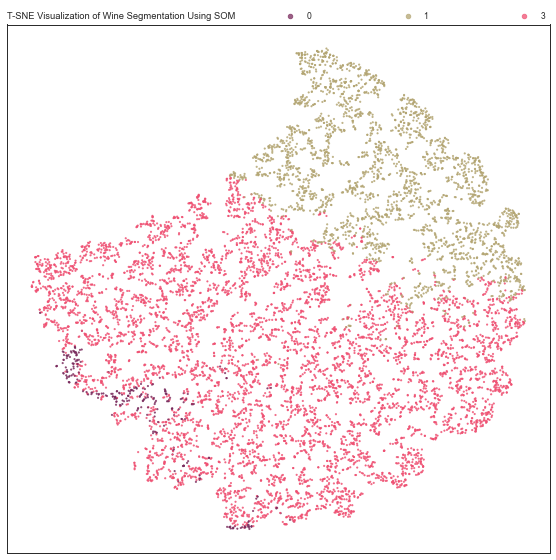

In [178]:
plot_clusters(tsne_value_somw, dfw_['wine_nodes'], 'T-SNE Visualization of Wine Segmentation Using SOM')


## Mean Shift Clustering

### Value

In [179]:
df_msv = df_nonoise[value_feats_mm].copy()

bandwidth = estimate_bandwidth(df_msv, quantile=.05, random_state=RANDOM_STATE, n_jobs=-1)
bandwidth

0.1717970434977587

In [180]:
msv = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = msv.fit_predict(df_msv)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)
df_msv['ms_value'] = ms_labels

Number of estimated clusters : 9


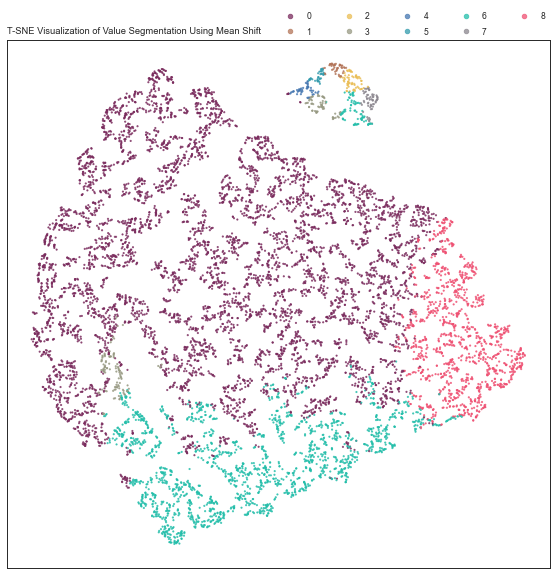

In [181]:
plot_clusters(tsne_value_somv, df_msv['ms_value'], 'T-SNE Visualization of Value Segmentation Using Mean Shift')


### Wine

In [182]:
df_msw = df_nonoise[wine_feats_dec].copy()

bandwidth = estimate_bandwidth(df_msw, quantile=.1, random_state=RANDOM_STATE, n_jobs=-1)
bandwidth

0.2029944194592844

In [183]:
msw = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
msw_labels = msw.fit_predict(df_msw)

ms_n_clusters = len(np.unique(msw_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)
df_msw['ms_wine'] = msw_labels

Number of estimated clusters : 5


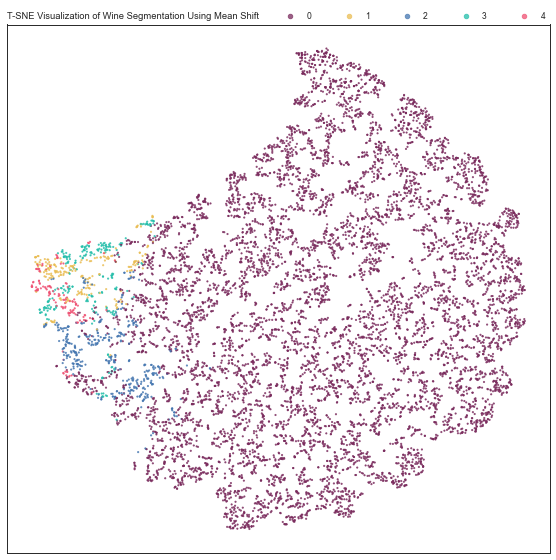

In [184]:
plot_clusters(tsne_value_somw, df_msw['ms_wine'], 'T-SNE Visualization of Wine Segmentation Using Mean Shift')


## DBSCAN

### Value

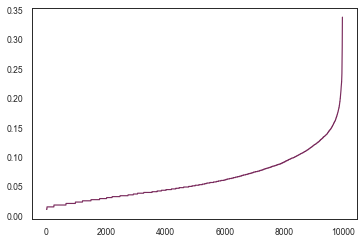

In [185]:
df_dbv = df_nonoise[wine_feats_dec].copy()

# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=10)
neigh.fit(df_dbv)
distances, _ = neigh.kneighbors(df_dbv)
distances = np.sort(distances[:, -1])
fig = plt.figure()
plt.plot(distances)
save_fig('Epsilon Plot for DBScan', fig)
plt.show()

In [186]:
# Perform DBSCAN clustering
dbscanv = DBSCAN(eps=0.12, min_samples=10, n_jobs=4)
dbscan_labels = dbscanv.fit_predict(df_dbv)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

df_dbv['db_value'] = dbscan_labels

Number of estimated clusters : 2


In [187]:
df_dbv.groupby(['db_value']).count()

,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec
db_value,,,,,,
-1,440,440,440,440,440,440
0,9526,9526,9526,9526,9526,9526


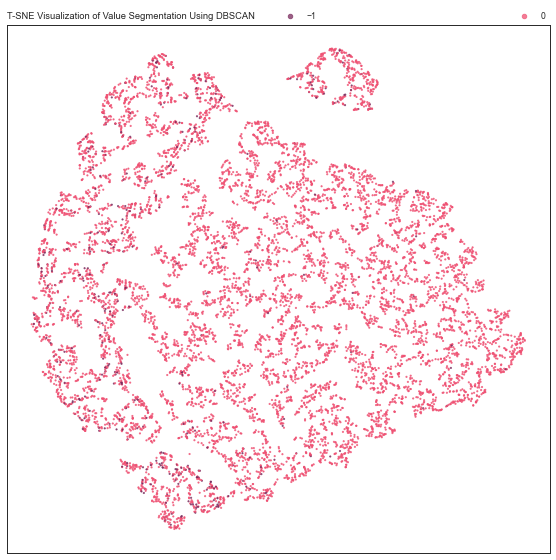

In [188]:
plot_clusters(tsne_value_somv, df_dbv['db_value'], 'T-SNE Visualization of Value Segmentation Using DBSCAN')


### Wine

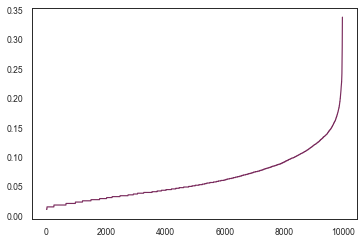

In [189]:
df_db = df_nonoise[wine_feats_dec].copy()

# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=10)
neigh.fit(df_db)
distances, _ = neigh.kneighbors(df_db)
distances = np.sort(distances[:, -1])
fig = plt.figure()
plt.plot(distances)
save_fig('Epsilon Plot for DBScan', fig)
plt.show()

In [190]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.13, min_samples=10, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_db)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

df_db['db_wine'] = dbscan_labels

Number of estimated clusters : 2


In [191]:
df_db.groupby(['db_wine']).count()

,Dryred_dec,Sweetred_dec,Drywh_dec,Sweetwh_dec,Dessert_dec,Exotic_dec
db_wine,,,,,,
-1,284,284,284,284,284,284
0,9682,9682,9682,9682,9682,9682


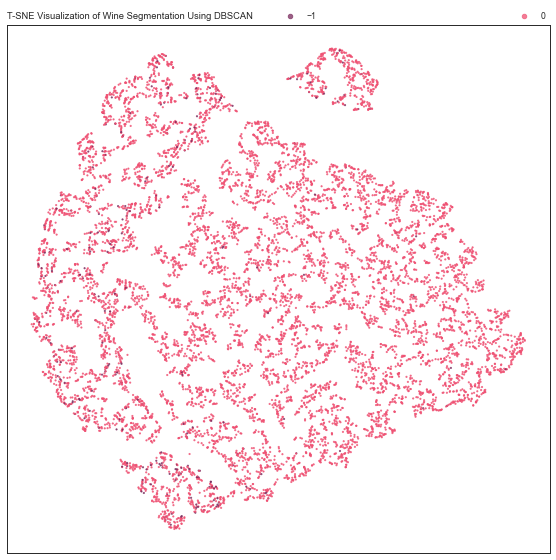

In [192]:
plot_clusters(tsne_value_somv, df_db['db_wine'], 'T-SNE Visualization of Wine Segmentation Using DBSCAN')
